In [1]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.activations import linear, relu, sigmoid
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import StratifiedKFold
import pandas as pd
import seaborn as sns
from PIL import Image
from tensorflow.keras import layers
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix, f1_score
import cv2
import os
import re
import math

## Exploratory Data Analysis

### Checking label, label name and image-name in data.csv

Import from data.csv, which consist the image name, corresponding label and label name, name dataframe as mj_df

In [2]:
mj_df = pd.read_csv("data.csv")
print('Shape of data:', mj_df.shape)

display(mj_df.head())

Shape of data: (700, 3)


,image-name,label,label-name
0,1.jpg,38,bonus-winter
1,2.jpg,26,characters-8
2,3.jpg,9,dots-9
3,4.jpg,36,bonus-summer
4,5.jpg,28,honors-east



It is noted that the "image-name" and "label-name" are with hyphen, change them to underscore to prevent error when calling df.XXX-XXX

In [3]:
mj_df = mj_df.rename(columns=lambda x: re.sub('-', '_', x))
mj_df = mj_df.rename(columns={'label': 'label_id'})

Afterwards, add a new column of image path to mj_df

In [4]:
image_path = os.path.join('images','{}')
mj_df['image_path'] = mj_df['image_name'].apply(lambda x :image_path.format(x))
mj_df.head()

,image_name,label_id,label_name,image_path
0,1.jpg,38,bonus-winter,images\1.jpg
1,2.jpg,26,characters-8,images\2.jpg
2,3.jpg,9,dots-9,images\3.jpg
3,4.jpg,36,bonus-summer,images\4.jpg
4,5.jpg,28,honors-east,images\5.jpg


Check if the data is consistent, including label and label_name

Text(0.5, 1.0, 'Label Name')

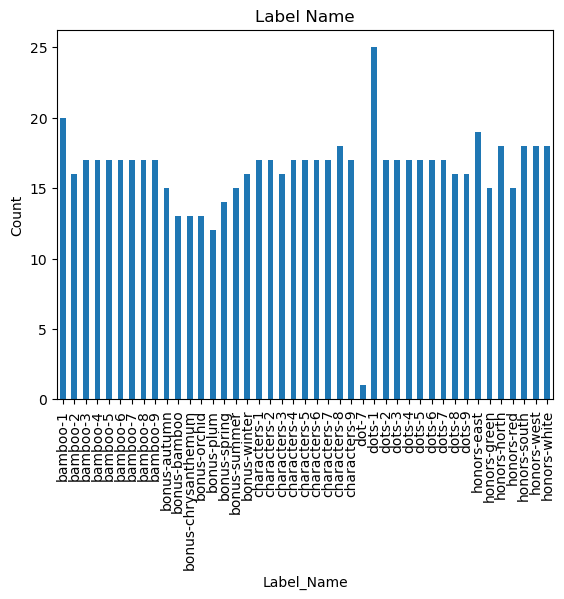

In [5]:
df_barchart = mj_df['label_name'].value_counts().sort_index()
df_barchart.plot.bar()
plt.ylabel("Count",fontsize=10)
plt.xlabel("Label_Name",fontsize=10)
plt.title("Label Name")

It is noted that there is a typo in one of the label_name, instead of "dot-7" it should be "dots-7", replace accordingly

In [6]:
mj_df['label_name'] = mj_df['label_name'].replace({'dot-7': 'dots-7'})

Text(0.5, 0, 'Label_Name')

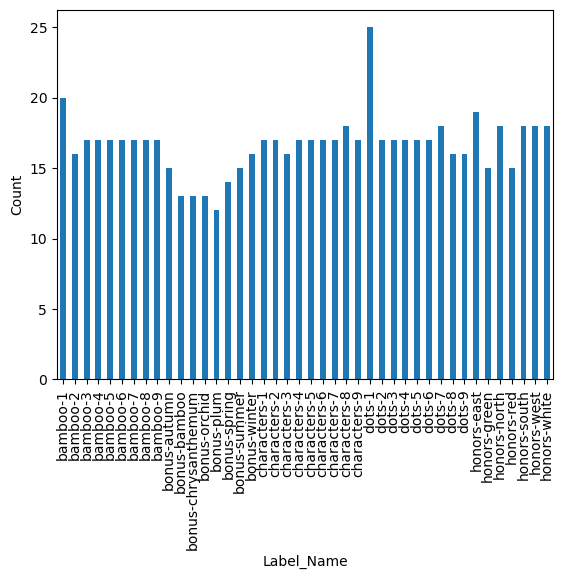

In [7]:
df_barchart = mj_df['label_name'].value_counts().sort_index()
df_barchart.plot.bar()
plt.ylabel("Count",fontsize=10)
plt.xlabel("Label_Name",fontsize=10)

Looking good, next check if there's any error for numeric labels.

Text(0.5, 1.0, 'Label ID')

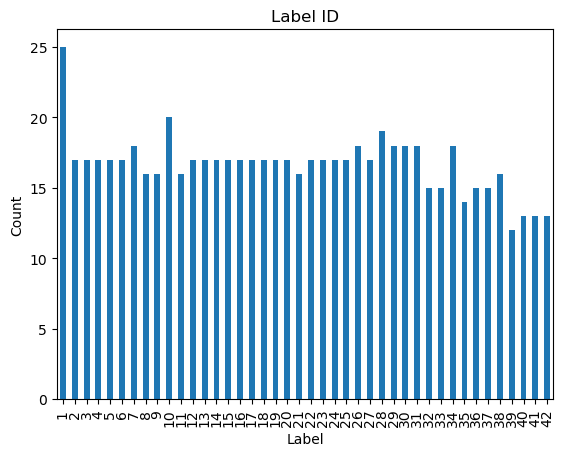

In [8]:
df_barchart = mj_df['label_id'].value_counts().sort_index()
df_barchart.plot.bar()
plt.ylabel("Count",fontsize=10)
plt.xlabel("Label",fontsize=10)
plt.title("Label ID")

It is noted the label starts at 1 instead of 0, subtract 1 from labels to facilitate classification by tensorflow later.

In [9]:
mj_df['label_id'] -= 1
mj_df.head()
print('mj_df Label starts at:', min(mj_df['label_id']), 'after subtract.')


mj_df Label starts at: 0 after subtract.


Then check if the label and label_name are unique pair.

In [10]:
mj_df.groupby(['label_id', 'label_name']).size()

label_id  label_name         
0         dots-1                 25
1         dots-2                 17
2         dots-3                 17
3         dots-4                 17
4         dots-5                 17
5         dots-6                 17
6         dots-7                 18
7         dots-8                 16
8         dots-9                 16
9         bamboo-1               20
10        bamboo-2               16
11        bamboo-3               17
12        bamboo-4               17
13        bamboo-5               17
14        bamboo-6               17
15        bamboo-7               17
16        bamboo-8               17
17        bamboo-9               17
18        characters-1           17
19        characters-2           17
20        characters-3           16
21        characters-4           17
22        characters-5           17
23        characters-6           17
24        characters-7           17
25        characters-8           18
26        characters-9           1

The label and label name pairs are unique, set num_classes as unique labels (42 classes)

In [11]:
num_classes = mj_df['label_id'].nunique()
print(num_classes, 'number of classes')

42 number of classes


### Loading and preprocessing of images

Afterwards, we would like to load the images into a list with cv2, at the same time check the aspect ratio of the photos.
Since data augmentation would be performed, the images shall be in same aspect ratio for image resize.

In [12]:
images= []
for index, row in mj_df[['image_path']].iterrows():
    img = cv2.imread(row[0], cv2.IMREAD_UNCHANGED)
    height, width = img.shape[:2]
    # Save the dimensions to a new column in the DataFrame
    mj_df.loc[index, 'width'] = width
    mj_df.loc[index, 'height'] = height
    if img is not None:
        images.append(img)
#calculate the image aspect ratio
mj_df['ratio'] = mj_df['width']/mj_df['height']

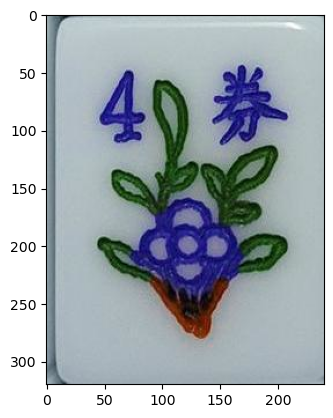

In [13]:
#Display of sample image
plt.imshow(images[0].astype("uint8"))

Most of the images have aspect ratio of 3:4, hence try to find ones that are not 3:4.

In [14]:
mj_df[mj_df['ratio'] != 0.75]

,image_name,label_id,label_name,image_path,width,height,ratio
640,641.jpg,28,honors-south,images\641.jpg,136.0,184.0,0.739130
687,688.jpg,39,bonus-orchid,images\688.jpg,89.0,116.0,0.767241


Noting two of the images don't have a ratio of 0.75, amend to size to allow uniform resize in data augmentation

In [15]:
images[640] = images[640][0:180, 0:135]
mj_df.loc[640, 'width'] = 135
mj_df.loc[640, 'height'] = 180
images[688] = images[688][0:116, 0:87]
mj_df.loc[688, 'width'] = 87
mj_df.loc[688, 'height'] = 116
print('shape of images[640]:',images[640].shape[:2])
print('shape of images[688]:',images[688].shape[:2])
mj_df['ratio'] = mj_df['width']/mj_df['height']

shape of images[640]: (180, 135)
shape of images[688]: (116, 87)


In [16]:
mj_df.loc[[640,688]]

,image_name,label_id,label_name,image_path,width,height,ratio
640,641.jpg,28,honors-south,images\641.jpg,135.0,180.0,0.75
688,689.jpg,40,bonus-chrysanthemum,images\689.jpg,87.0,116.0,0.75


### Spot checking of images in each class

Now we will display the first few images from the same label, to get a sense of our data.

Int64Index([ 92, 103, 112, 122, 172, 197, 248, 295, 337, 373, 415, 428, 429,
            430, 431, 502, 540, 582, 583, 584, 585, 627, 656, 674, 675],
           dtype='int64')


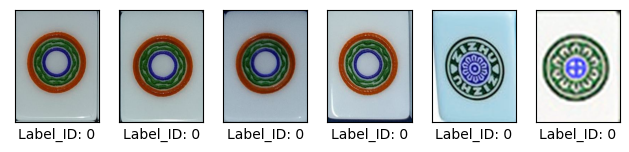

Int64Index([ 18,  61,  78, 126, 171, 193, 227, 292, 336, 370, 412, 436, 499,
            537, 579, 624, 657],
           dtype='int64')


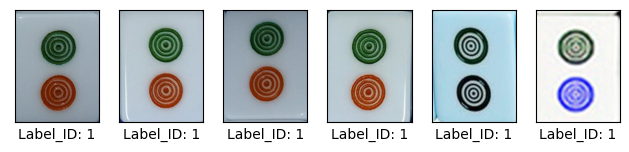

Int64Index([15, 16, 22, 46, 170, 189, 237, 289, 335, 367, 409, 437, 496, 534,
            576, 621, 658],
           dtype='int64')


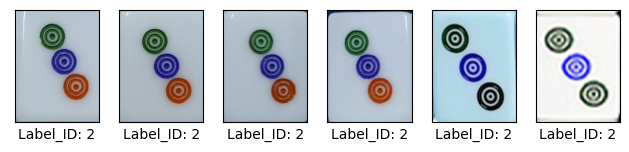

Int64Index([ 62,  66, 104, 119, 169, 184, 249, 286, 334, 364, 406, 438, 493,
            531, 573, 618, 659],
           dtype='int64')


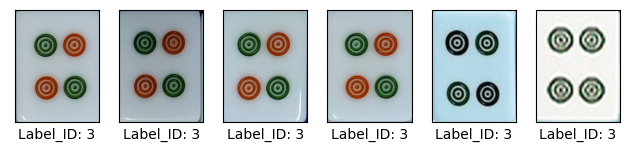

Int64Index([57, 76, 86, 90, 168, 183, 228, 283, 333, 361, 403, 439, 490, 528,
            570, 615, 660],
           dtype='int64')


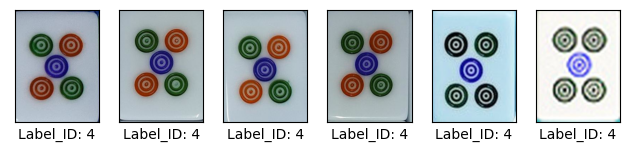

Int64Index([ 26,  47,  60, 111, 167, 196, 238, 280, 332, 358, 400, 420, 487,
            525, 567, 612, 661],
           dtype='int64')


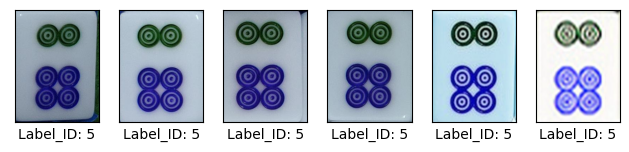

Int64Index([ 25,  45,  89, 101, 166, 192, 250, 277, 331, 355, 397, 421, 484,
            522, 564, 609, 628, 662],
           dtype='int64')


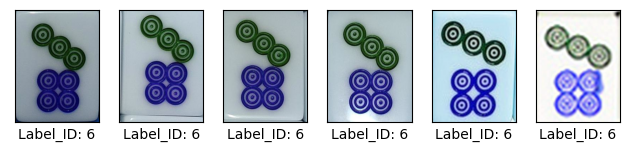

Int64Index([75, 129, 165, 188, 239, 274, 330, 349, 352, 393, 422, 481, 519,
            561, 606, 663],
           dtype='int64')


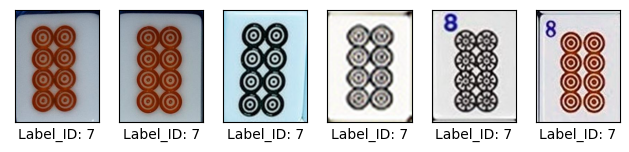

Int64Index([2, 12, 123, 127, 164, 182, 254, 271, 329, 391, 423, 478, 516, 558,
            603, 664],
           dtype='int64')


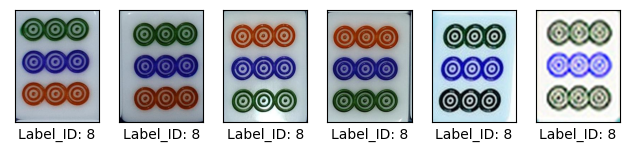

Int64Index([ 31,  51,  64,  73, 163, 199, 259, 294, 304, 372, 414, 452, 501,
            539, 581, 626, 643, 665, 676, 677],
           dtype='int64')


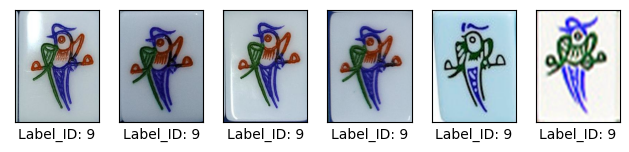

Int64Index([68, 130, 137, 162, 195, 231, 291, 303, 369, 411, 457, 498, 536,
            578, 623, 666],
           dtype='int64')


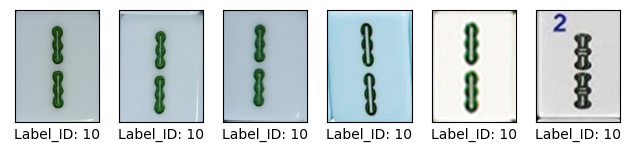

Int64Index([ 29,  54,  77, 133, 161, 191, 243, 288, 298, 366, 408, 458, 495,
            533, 575, 620, 667],
           dtype='int64')


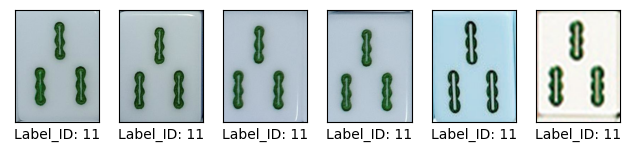

Int64Index([ 69,  70,  87, 117, 160, 187, 241, 285, 297, 363, 405, 459, 492,
            530, 572, 617, 668],
           dtype='int64')


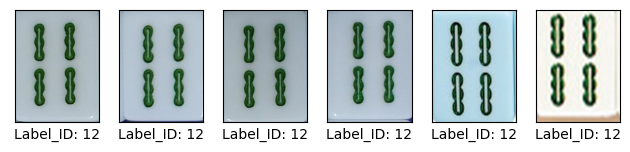

Int64Index([ 95,  97, 105, 134, 159, 186, 233, 282, 302, 360, 402, 460, 489,
            527, 569, 614, 669],
           dtype='int64')


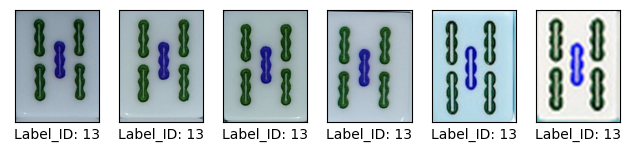

Int64Index([ 59,  72,  79, 100, 158, 198, 230, 279, 301, 357, 399, 447, 486,
            524, 566, 611, 670],
           dtype='int64')


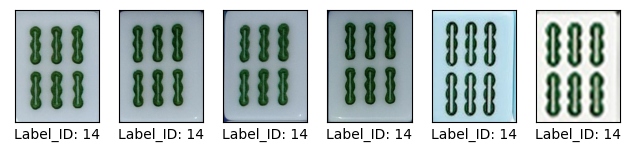

Int64Index([7, 28, 71, 124, 157, 194, 240, 276, 300, 354, 396, 448, 483, 521,
            563, 608, 671],
           dtype='int64')


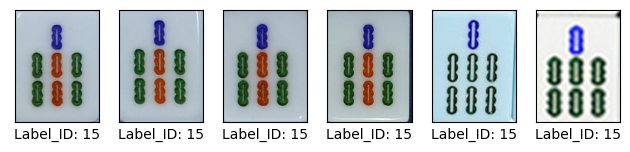

Int64Index([ 58,  74, 113, 114, 156, 190, 229, 273, 299, 351, 394, 449, 480,
            518, 560, 605, 672],
           dtype='int64')


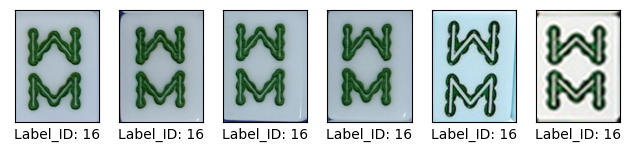

Int64Index([ 83,  85, 107, 120, 155, 185, 255, 270, 296, 348, 390, 450, 477,
            515, 557, 602, 673],
           dtype='int64')


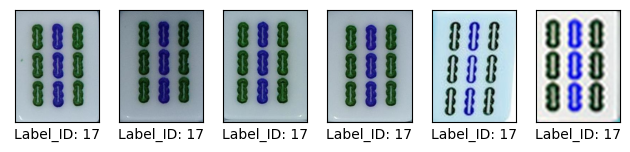

Int64Index([ 44,  50,  55, 121, 181, 223, 224, 293, 328, 371, 413, 451, 500,
            538, 580, 625, 647],
           dtype='int64')


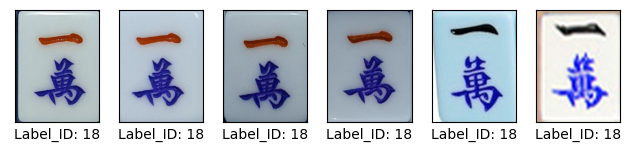

Int64Index([ 10,  65,  88, 106, 180, 217, 234, 290, 327, 368, 410, 453, 497,
            535, 577, 622, 648],
           dtype='int64')


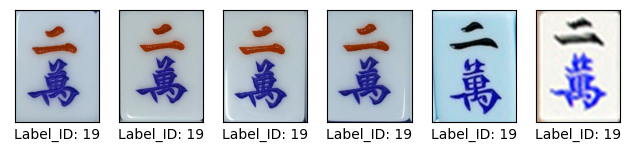

Int64Index([48, 82, 84, 179, 213, 245, 287, 326, 365, 407, 454, 494, 532, 574,
            619, 649],
           dtype='int64')


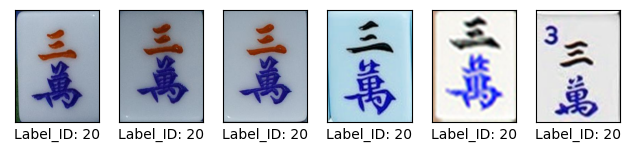

Int64Index([17, 20, 35, 91, 178, 206, 225, 284, 325, 362, 404, 455, 491, 529,
            571, 616, 650],
           dtype='int64')


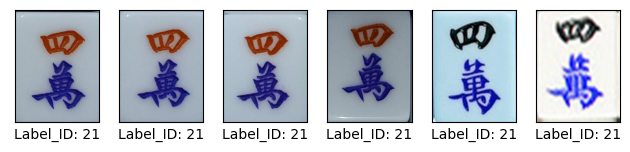

Int64Index([ 13,  21,  42, 118, 177, 222, 235, 281, 324, 359, 401, 456, 488,
            526, 568, 613, 651],
           dtype='int64')


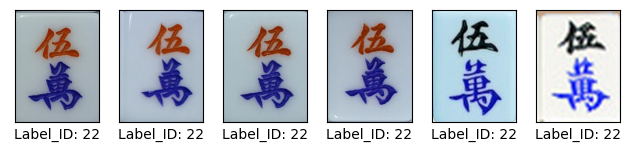

Int64Index([6, 41, 53, 128, 176, 221, 246, 278, 323, 356, 398, 443, 485, 523,
            565, 610, 652],
           dtype='int64')


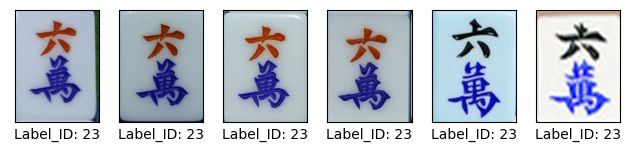

Int64Index([ 24,  30, 131, 136, 175, 216, 226, 275, 322, 353, 395, 444, 482,
            520, 562, 607, 653],
           dtype='int64')


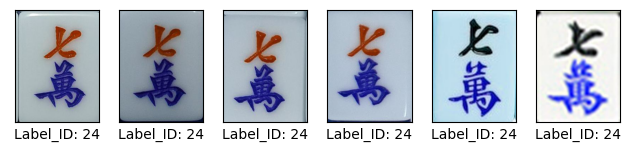

Int64Index([  1,  11,  39, 132, 174, 212, 236, 272, 321, 350, 392, 445, 479,
            517, 559, 604, 654, 678],
           dtype='int64')


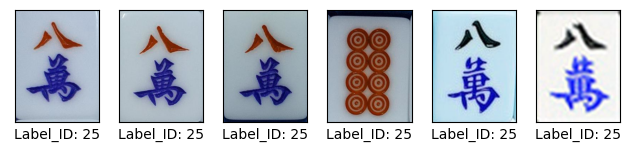

Int64Index([ 40,  99, 102, 116, 173, 205, 247, 269, 320, 347, 389, 446, 476,
            514, 556, 601, 655],
           dtype='int64')


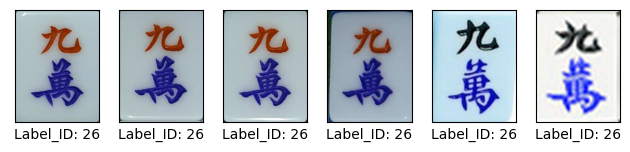

Int64Index([  4,  63, 109, 139, 146, 220, 242, 268, 319, 346, 387, 432, 474,
            512, 554, 599, 630, 639, 696],
           dtype='int64')


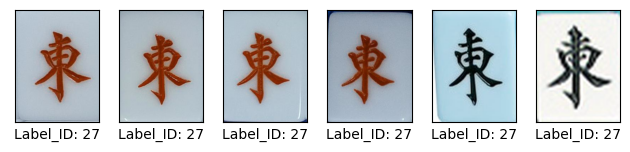

Int64Index([ 19,  23,  81, 110, 145, 215, 232, 266, 318, 345, 384, 433, 471,
            509, 551, 596, 640, 697],
           dtype='int64')


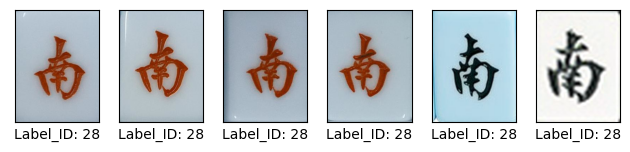

Int64Index([  9,  37,  67,  98, 144, 211, 257, 267, 317, 344, 386, 434, 473,
            511, 550, 598, 641, 698],
           dtype='int64')


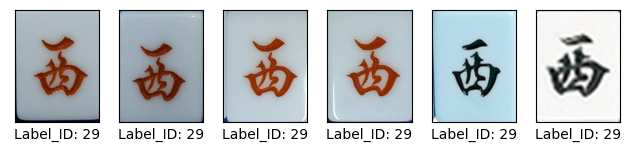

Int64Index([  8,  14,  52,  80, 143, 204, 258, 264, 316, 338, 383, 418, 470,
            508, 553, 595, 642, 699],
           dtype='int64')


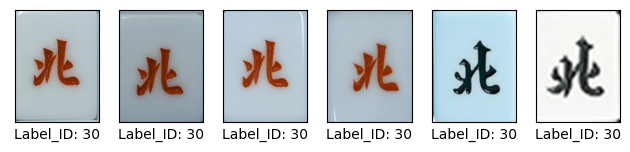

Int64Index([32, 43, 56, 115, 142, 219, 315, 388, 416, 475, 513, 555, 600, 644,
            693],
           dtype='int64')


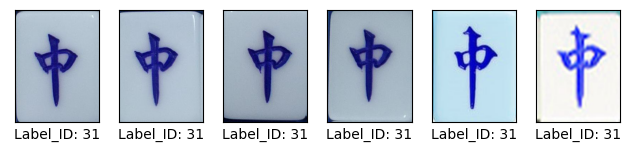

Int64Index([27, 49, 108, 125, 141, 218, 314, 385, 417, 472, 510, 552, 597, 645,
            695],
           dtype='int64')


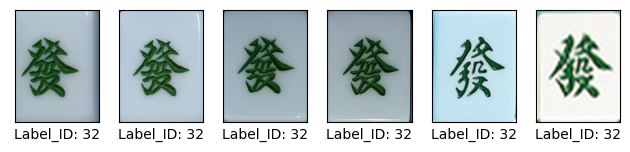

Int64Index([ 34,  38,  93,  96, 140, 214, 244, 265, 313, 339, 382, 427, 469,
            507, 549, 594, 646, 694],
           dtype='int64')


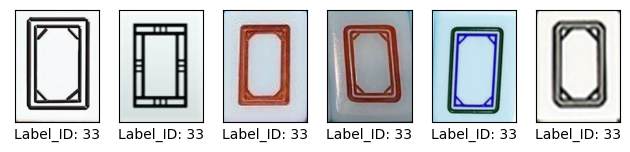

Int64Index([135, 154, 210, 256, 260, 312, 340, 381, 426, 468, 544, 589, 638,
            683],
           dtype='int64')


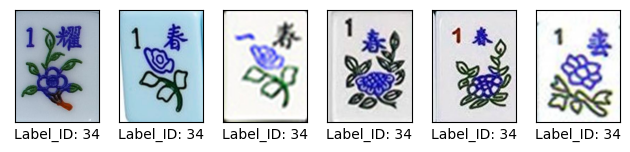

Int64Index([3, 153, 209, 253, 261, 311, 342, 380, 425, 467, 543, 588, 637, 684,
            690],
           dtype='int64')


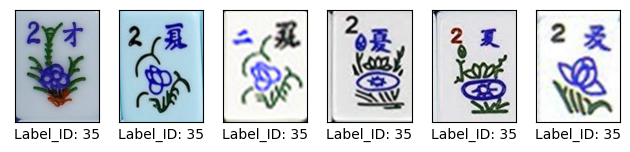

Int64Index([5, 152, 208, 252, 262, 310, 341, 379, 424, 466, 542, 587, 636, 685,
            691],
           dtype='int64')


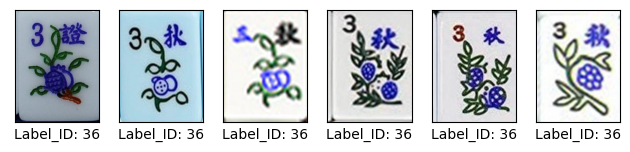

Int64Index([0, 151, 207, 251, 263, 309, 343, 378, 419, 465, 541, 586, 629, 635,
            686, 692],
           dtype='int64')


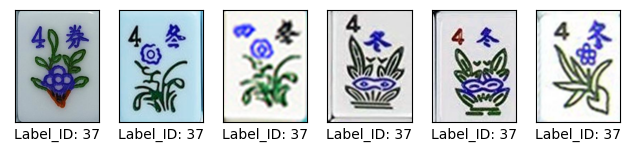

Int64Index([36, 150, 203, 308, 377, 442, 464, 506, 548, 593, 634, 679], dtype='int64')


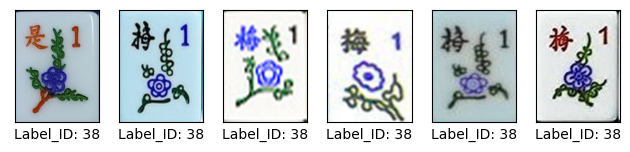

Int64Index([138, 149, 202, 307, 376, 441, 463, 505, 547, 592, 633, 680, 687], dtype='int64')


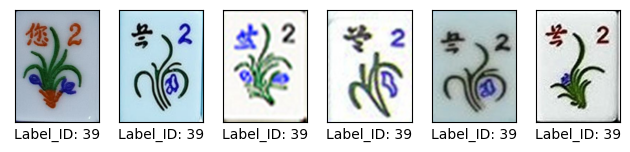

Int64Index([33, 147, 201, 306, 375, 440, 462, 504, 546, 591, 632, 681, 688], dtype='int64')


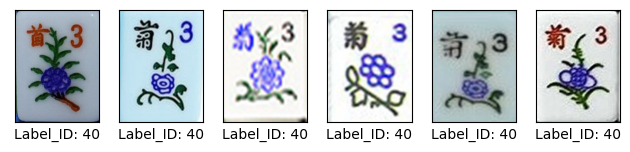

Int64Index([94, 148, 200, 305, 374, 435, 461, 503, 545, 590, 631, 682, 689], dtype='int64')


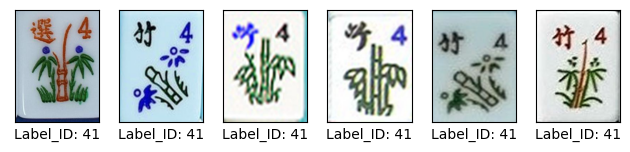

In [17]:
img_arr_withlabel = []
label_arr = np.array(mj_df['label_id'])
for label_id in range(42):
    img_index = mj_df.index[mj_df['label_id'] == label_id]
    print(img_index)
    for i, index in enumerate(img_index[:6]):
        plt.subplot(1, 6, i+1)
        plt.imshow(images[index].astype("uint8"))
        plt.grid(False)
        plt.xticks([])
        plt.yticks([])
        #label is a batch of 16 one-hot encoded feature, get the first one from the batch
        plt.xlabel('Label_ID: '+ str(label_id))
        plt.tight_layout()
    plt.show()
    #display_image(img_arr_withlabel, label_arr, len(label_arr))

Few observations were made:
1. Wrong label discovered for label_id 25, image with index 132 should have a label_id of 7 instead of 25.
2. Tiles of label_id 34-41 could vary a lot, hence affecting the accuracy of classification in upcoming tasks.

As such, we will revise the label of index 132.

In [18]:
mj_df.loc[132,['label_id', 'label_name']] = [7, 'dots-8']

In [19]:
label = np.array(mj_df['label_id'])

In [20]:
#Set the image height, image width and number of classes for tensor/
img_height = 224
img_width = 224
num_classes = 42

## Train test split

Split the data set into 80% train/val and 20% test set, by index. Since each label has limited number of sample (e.g. for label 38 bonus-plum  there's only 12 samples), it is preferred to use stratified train/test split.

Size of train set: (560,)
Size of test set: (140,)


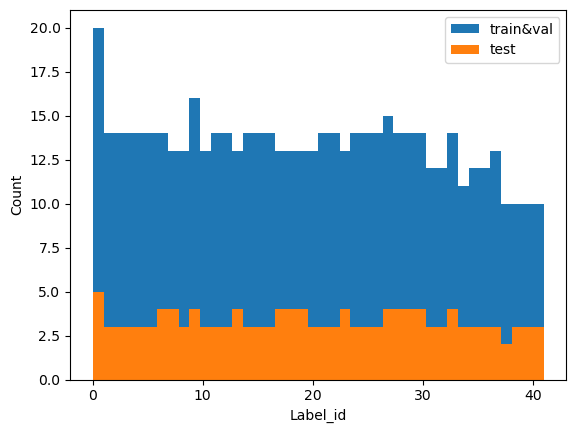

In [21]:
indices_trainval, indices_test = train_test_split(np.arange(label.shape[0]), test_size=0.2, random_state=320, stratify=label)
#check size of train set
print('Size of train set:',indices_trainval.shape)
print('Size of test set:',indices_test.shape)
plt.tight_layout()
plt.hist(label[indices_trainval], label="train&val", bins = num_classes)
plt.hist(label[indices_test], label="test", bins = num_classes)
plt.ylabel('Count')
plt.xlabel('Label_id')
plt.legend(loc=1)

## Tensor model setup

### Create base model with Mobilenet V2

In [22]:
AUTOTUNE = tf.data.AUTOTUNE

In [23]:
#Specifying the include_top=False argument, so that the network doesn't include the classification layers at the top
base_model = tf.keras.applications.MobileNetV2(input_shape=(img_height, img_width, 3),
                                               include_top=False,
                                               weights='imagenet')


In [24]:
#Set base model to trainable, and check the number of layers in base model
base_model.trainable = True
print("Number of layers in the base model: ", len(base_model.layers))

# Fine-tune from this layer onwards
fine_tune_at = 90

# Freeze all the layers before the `fine_tune_at` layer
for layer in base_model.layers[:fine_tune_at]:
  layer.trainable = False

Number of layers in the base model:  154


In [25]:
#Set base_model as not trainable, which prevents the weights in a given layer from being updated during training, to allow extraction of features
base_model.trainable = False

In [26]:
print("Number of layers in the base model: ", len(base_model.layers))

Number of layers in the base model:  154


### Define classification layer, second last layer (Conv2D), and input processing/ augmentation

In [65]:
#Use tf.keras.layers.GlobalAveragePooling2D layer to convert the features to a single vector per image
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()


In [66]:
#Convert features into a single prediction per image,with 42 classes
prediction_layer = tf.keras.layers.Dense(num_classes, activation='softmax')


In [94]:
#Define data normalization with tf.keras.applications.mobilenet_v2.preprocess_input and data augmentation
preprocess_input = tf.keras.applications.mobilenet_v2.preprocess_input

#Convert features into a single prediction per image,with 42 classes
prediction_layer = tf.keras.layers.Dense(num_classes, activation='softmax')

#Use tf.keras.layers.GlobalAveragePooling2D layer to convert the features to a single vector per image
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()

data_augmentation = tf.keras.Sequential([
    layers.RandomZoom(0.1),
    layers.RandomRotation(0.5),
    layers.RandomBrightness(0.5),
    layers.RandomContrast(0.3),
    layers.RandomFlip("horizontal_and_vertical"),  
    layers.RandomTranslation(height_factor = (-0.2,0), width_factor = 0.2, fill_mode = 'nearest')
])

In [95]:
inputs = tf.keras.Input(shape=(224, 224, 3))

x = data_augmentation(inputs)
print(x.shape)
      
x = preprocess_input(x)
print(x.shape)

x = base_model(x, training=False)
print(x.shape)

x = global_average_layer(x)
print(x.shape)

outputs = prediction_layer(x)

print('Output has a dimension of: ' + str(outputs.shape))
model = tf.keras.Model(inputs, outputs)

(None, 224, 224, 3)
(None, 224, 224, 3)
(None, 7, 7, 1280)
(None, 1280)
Output has a dimension of: (None, 42)


## Training the output layer and final layers

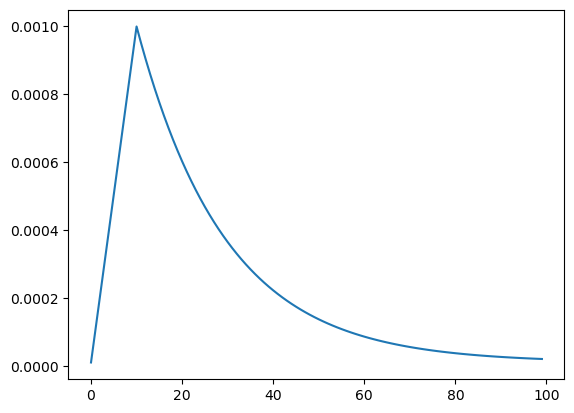

In [27]:
def scheduler(epoch):
    LR_START = 1e-5
    LR_MAX = 1e-3
    LR_MIN = 1e-5
    LR_RAMPUP_EPOCHS = 10
    LR_SUSTAIN_EPOCHS = 0
    LR_EXP_DECAY = .95

    if epoch < LR_RAMPUP_EPOCHS:
        lr = (LR_MAX - LR_START) / LR_RAMPUP_EPOCHS * epoch + LR_START
    elif epoch < LR_RAMPUP_EPOCHS + LR_SUSTAIN_EPOCHS:
        lr = LR_MAX
    else:
        lr = (LR_MAX - LR_MIN) * LR_EXP_DECAY**(epoch - LR_RAMPUP_EPOCHS - LR_SUSTAIN_EPOCHS) + LR_MIN

    return lr
cosine_scheduler_callback = tf.keras.callbacks.LearningRateScheduler(scheduler, verbose=False)
plt.plot([scheduler(x) for x in range(100)]);


In [97]:
base_learning_rate = 0.001
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=base_learning_rate),
              loss=tf.keras.losses.CategoricalCrossentropy(from_logits = False),
              metrics=['accuracy'] )
model.summary()

Model: "model_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_8 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 sequential_2 (Sequential)   (None, 224, 224, 3)       0         
                                                                 
 tf.math.truediv_6 (TFOpLamb  (None, 224, 224, 3)      0         
 da)                                                             
                                                                 
 tf.math.subtract_6 (TFOpLam  (None, 224, 224, 3)      0         
 bda)                                                            
                                                                 
 mobilenetv2_1.00_224 (Funct  (None, 7, 7, 1280)       2257984   
 ional)                                                          
                                                           

### Model Output Layer Training

In [28]:
#Create checkpoint for callback
checkpoint_path = "training_fold/cp.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)

cp_callback = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,
                                                 save_weights_only=True,
                                                 verbose=1)

In [29]:
#Set batch size to 16 to speed up training
batch_size = 16

In [30]:
def read_image(image_path):
    '''Get image from image_path with tf.image.decode_image'''
    return tf.image.decode_image(tf.io.read_file(image_path), channels=3, expand_animations=False)

In [31]:
def get_Xy(indices):
    '''Get X (image_path) and y (label_id) from the index array'''
    X = mj_df.loc[indices]['image_path']
    y = mj_df.loc[indices]['label_id']
    return X,y

In [32]:
def resize(image):
    '''Resize image to designated size (224x224x3) for tensorflow's process'''
    image = tf.image.resize(image, (img_width, img_height), method='nearest')
    return image

In [33]:
def get_ds(indices):
    '''Get tensor ds from input index, 1. get_Xy; 2. read_image, resize on image_ds; 3. get one-hot label_ds; 4. zip for ds'''
    X, y = get_Xy(indices)
    
    image_ds = tf.data.Dataset.from_tensor_slices(X)
    image_ds = image_ds.map(read_image, num_parallel_calls=AUTOTUNE)
    image_ds = image_ds.map(resize, num_parallel_calls=AUTOTUNE)
    
    label_ds = tf.keras.utils.to_categorical(y, num_classes=None, dtype='float32')
    label_ds = tf.data.Dataset.from_tensor_slices(label_ds)
    
    ds = tf.data.Dataset.zip((image_ds, label_ds)).batch(batch_size)
    ds = ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
    
    return ds

Train test 1 has (448,) no of entries.
Train test 2 has (448,) no of entries.
Train test 3 has (448,) no of entries.
Train test 4 has (448,) no of entries.
Train test 5 has (448,) no of entries.


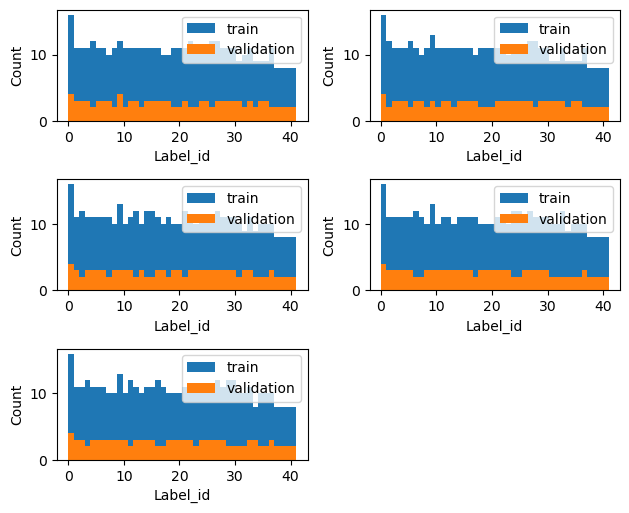

In [34]:
n= 0
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=320)

for train_index, val_index in skf.split(indices_trainval, label[indices_trainval]):
    train_index= np.take(indices_trainval, train_index)
    val_index= np.take(indices_trainval, val_index)
    X_train, y_train = get_Xy(train_index)
    X_val, y_val = get_Xy(val_index)
    n += 1
    print('Train test', n, 'has', X_train.shape ,'no of entries.')
    plt.tight_layout()
    plt.subplot(3, 2, n)
    plt.hist(y_train, label="train", bins = num_classes)
    plt.hist(y_val, label="validation", bins = num_classes)
    plt.ylabel('Count')
    plt.xlabel('Label_id')
    plt.legend(loc=1)

In [35]:
model.save_weights('model.h5')

NameError: name 'model' is not defined

In [103]:
total_epochs = 0
acc = []
val_acc = []
loss = []
val_loss = []
acc_tuple = ()
loss_tuple = ()
acc_performance =[]
loss_performance = []

fold = 0


In [104]:
for train_index, val_index in skf.split(indices_trainval, label[indices_trainval]):
    
    train_index= np.take(indices_trainval, train_index)
    val_index= np.take(indices_trainval, val_index)
    
    train_ds = get_ds(train_index)
    val_ds = get_ds(val_index)

    model.reset_states()
    model.load_weights('model.h5')
    
    epochs = 20
    cp_callback = tf.keras.callbacks.ModelCheckpoint(f"weights-{fold}.hdf5", save_best_only=True, save_weights_only=True)
    
    history = model.fit(train_ds,  
                        validation_data=val_ds,
                        epochs = epochs,
                        callbacks=[cp_callback]
                        )
    callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
    
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    acc_tuple = (fold, acc, val_acc)
    acc_performance.append(acc_tuple)

    loss = history.history['loss']
    val_loss = history.history['val_loss']
    loss_tuple = (fold, loss,val_loss)
    loss_performance.append(loss_tuple)

    fold += 1

Epoch 1/20
28/28 [==============================] - 26s 526ms/step - loss: 3.6908 - accuracy: 0.0714 - val_loss: 2.7759 - val_accuracy: 0.2500
Epoch 2/20
28/28 [==============================] - 14s 486ms/step - loss: 2.4788 - accuracy: 0.3013 - val_loss: 2.1957 - val_accuracy: 0.3214
Epoch 3/20
28/28 [==============================] - 13s 483ms/step - loss: 1.9887 - accuracy: 0.4330 - val_loss: 1.9312 - val_accuracy: 0.3571
Epoch 4/20
28/28 [==============================] - 13s 484ms/step - loss: 1.7173 - accuracy: 0.5022 - val_loss: 1.8140 - val_accuracy: 0.4464
Epoch 5/20
28/28 [==============================] - 14s 494ms/step - loss: 1.5691 - accuracy: 0.5469 - val_loss: 1.6880 - val_accuracy: 0.4286
Epoch 6/20
28/28 [==============================] - 14s 508ms/step - loss: 1.3612 - accuracy: 0.6250 - val_loss: 1.5497 - val_accuracy: 0.5089
Epoch 7/20
28/28 [==============================] - 14s 494ms/step - loss: 1.1950 - accuracy: 0.6652 - val_loss: 1.4856 - val_accuracy: 0.5536

### Model Evaluation

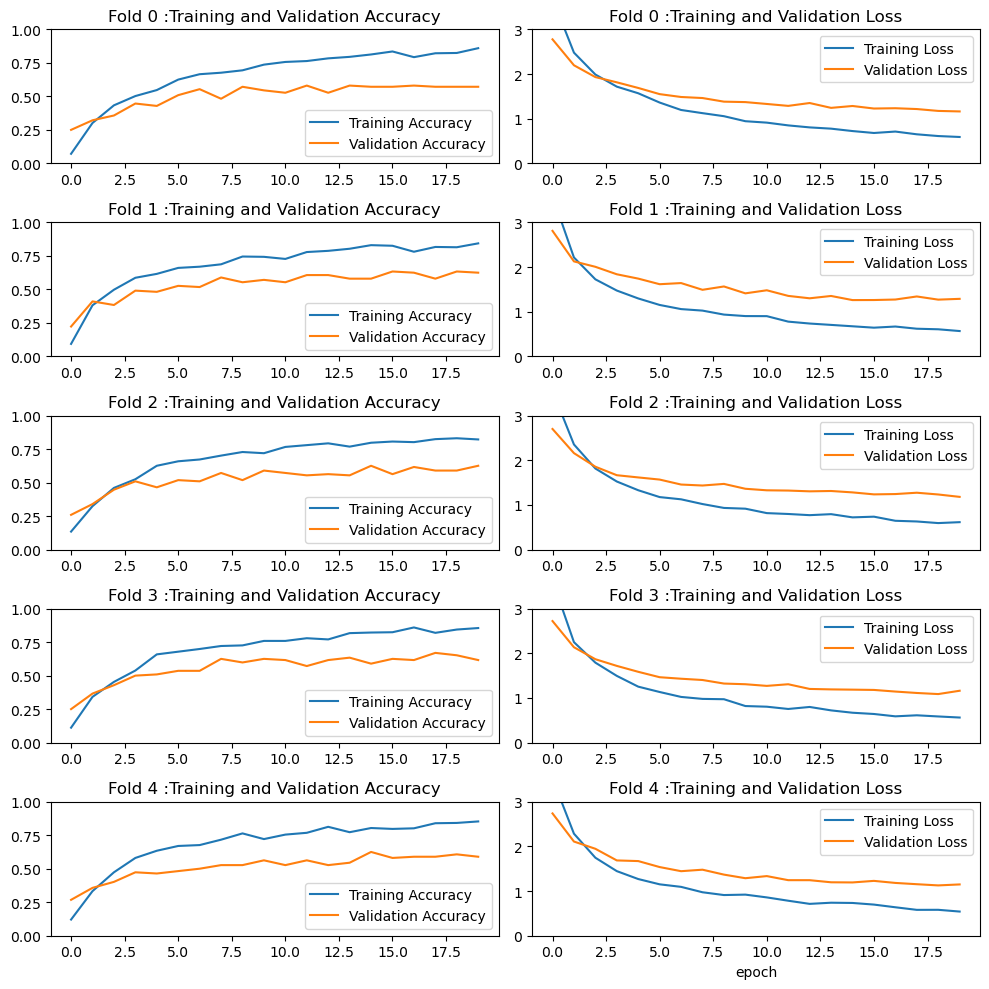

In [105]:
fig, ax = plt.subplots(5, 2, figsize=(10, 10))

for i in range(5):

    ax[i, 0].plot(acc_performance[i][1], label='Training Accuracy')
    ax[i, 0].plot(acc_performance[i][2], label='Validation Accuracy')
    ax[i, 0].set_ylim([0, 1])
    ax[i, 0].legend(loc='lower right')
    title = 'Fold {} :Training and Validation Accuracy'.format(i)
    ax[i, 0].set_title(title)
    plt.xlabel('epoch')
    
    ax[i, 1].plot(loss_performance[i][1], label='Training Loss')
    ax[i, 1].plot(loss_performance[i][2], label='Validation Loss')
    ax[i, 1].set_ylim([0, 3.0])
    ax[i, 1].legend(loc='upper right')
    title = 'Fold {} :Training and Validation Loss'.format(i)
    ax[i, 1].set_title(title)
    plt.xlabel('epoch')

plt.tight_layout()
plt.show()
    
    

By training the output layer and second last layer only, it is noted that the model successfully improve in training accuracy, but the model demonstrated overfitting. Let's try to mitigate overfitting by introducing more data augmentation, and changing the images to grey scale.

## Revised model with base model training

In [97]:
def random_jpeg_quality(image):
    return tf.image.random_jpeg_quality(image, min_jpeg_quality=99, max_jpeg_quality=100)

In [98]:
def image_to_greyscale(image):
    return tf.image.rgb_to_grayscale(image)

In [106]:
def encode_image(img):
  image = tf.image.convert_image_dtype(img, tf.uint8)
  quality = tf.random.uniform(shape=(), minval=95, maxval=100, dtype=tf.int32)
  return tf.image.encode_jpeg(image, quality=quality)


In [99]:
def get_ds(indices):
    '''Get tensor ds from input index, 1. get_Xy; 2. read_image, resize on image_ds; 3. get one-hot label_ds; 4. zip for ds'''
    X, y = get_Xy(indices)
    
    image_ds = tf.data.Dataset.from_tensor_slices(X)
    image_ds = image_ds.map(read_image, num_parallel_calls=AUTOTUNE)
    image_ds = image_ds.map(resize, num_parallel_calls=AUTOTUNE)
    
    label_ds = tf.keras.utils.to_categorical(y, num_classes=None, dtype='float32')
    label_ds = tf.data.Dataset.from_tensor_slices(label_ds)
    
    ds = tf.data.Dataset.zip((image_ds, label_ds)).batch(batch_size)
    ds = ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
    
    return ds

In [100]:
#Set base_model as not trainable, which prevents the weights in a given layer from being updated during training, to allow extraction of features
base_model.trainable = False

In [108]:
#Define data normalization with tf.keras.applications.mobilenet_v2.preprocess_input and data augmentation
preprocess_input = tf.keras.applications.mobilenet_v2.preprocess_input

#Convert features into a single prediction per image,with 42 classes
prediction_layer = tf.keras.layers.Dense(num_classes, activation='softmax')

#Use tf.keras.layers.GlobalAveragePooling2D layer to convert the features to a single vector per image
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()

data_augmentation = tf.keras.Sequential([
    layers.RandomZoom(0.1),
    layers.RandomRotation(0.5),
    layers.RandomBrightness(0.5),
    layers.RandomContrast(0.3), 
    layers.RandomFlip("horizontal_and_vertical"),  
    layers.RandomTranslation(height_factor = (-0.2,0), width_factor = 0.2, fill_mode = 'nearest')
])

In [109]:
inputs = tf.keras.Input(shape=(224, 224, 3))

x = data_augmentation(inputs)
print(x.shape)


x = preprocess_input(x)
print(x.shape)

x = base_model(x, training=False)
print(x.shape)

x = global_average_layer(x)
print(x.shape)

outputs = prediction_layer(x)

print('Output has a dimension of: ' + str(outputs.shape))
model = tf.keras.Model(inputs, outputs)

(None, 224, 224, 3)
(None, 224, 224, 3)
(None, 7, 7, 1280)
(None, 1280)
Output has a dimension of: (None, 42)


In [110]:
base_learning_rate = 0.001
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=base_learning_rate),
              loss=tf.keras.losses.CategoricalCrossentropy(from_logits = False),
              metrics=['accuracy'] )
model.summary()

Model: "model_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_24 (InputLayer)       [(None, 224, 224, 3)]     0         
                                                                 
 sequential_17 (Sequential)  (None, 224, 224, 3)       0         
                                                                 
 tf.math.truediv_9 (TFOpLamb  (None, 224, 224, 3)      0         
 da)                                                             
                                                                 
 tf.math.subtract_9 (TFOpLam  (None, 224, 224, 3)      0         
 bda)                                                            
                                                                 
 mobilenetv2_1.00_224 (Funct  (None, 7, 7, 1280)       2257984   
 ional)                                                          
                                                           

In [111]:
model.save_weights('model.h5')

In [130]:
total_epochs = 0
acc = []
val_acc = []
loss = []
val_loss = []
acc_tuple = ()
loss_tuple = ()
acc_performance =[]
loss_performance = []

fold = 0


In [127]:
print('Fold {} output layer training'.format(2))

Fold 2 output layer training


In [131]:
for train_index, val_index in skf.split(indices_trainval, label[indices_trainval]):
    
    train_index= np.take(indices_trainval, train_index)
    val_index= np.take(indices_trainval, val_index)
    
    train_ds = get_ds(train_index)
    val_ds = get_ds(val_index)
    
    base_model.trainable = False
    base_learning_rate = 0.001   
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=base_learning_rate),
              loss=tf.keras.losses.CategoricalCrossentropy(from_logits = False),
              metrics=['accuracy'] )    
    
    model.reset_states()
    model.load_weights('model.h5')
   
    total_epochs = 0
    
    epochs = 20
    cp_callback = tf.keras.callbacks.ModelCheckpoint(f"weights-{fold}.hdf5", save_best_only=True, save_weights_only=True)
    
    print('Fold {} output layers training'.format(fold))
    
    history = model.fit(train_ds,  
                        validation_data=val_ds,
                        epochs = epochs,
                        callbacks=[cp_callback]
                        )
    callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
    
    total_epochs += epochs
    
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    acc_tuple = (fold, acc, val_acc)
    acc_performance.append(acc_tuple)

    loss = history.history['loss']
    val_loss = history.history['val_loss']
    loss_tuple = (fold, loss,val_loss)
    loss_performance.append(loss_tuple)
    

    #Base model layer training

#Set base model to trainable
    base_model.trainable = True

    # Fine-tune from this layer onwards
    fine_tune_at = 90

    # Freeze all the layers before the `fine_tune_at` layer
    for layer in base_model.layers[:fine_tune_at]:
      layer.trainable = False

    #Compile to model again
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=base_learning_rate/10),
              loss=tf.keras.losses.CategoricalCrossentropy(from_logits = False),
              metrics=['accuracy'] )
    
    cp_callback = tf.keras.callbacks.ModelCheckpoint(f"weights-fine-{fold}.hdf5", save_best_only=True, save_weights_only=True)

#Continue training
    print('Fold {} base model training'.format(fold))

    history = model.fit(train_ds,  
                        validation_data=val_ds,
                        epochs = total_epochs + epochs,
                        initial_epoch = total_epochs,
                        callbacks=[cp_callback]
                        )
    callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
    
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    acc_tuple = (fold, acc, val_acc)
    acc_performance.append(acc_tuple)

    loss = history.history['loss']
    val_loss = history.history['val_loss']
    loss_tuple = (fold, loss,val_loss)
    loss_performance.append(loss_tuple)
    
    fold += 1

Fold 0 output layers training
Epoch 1/20
28/28 [==============================] - 26s 554ms/step - loss: 3.7301 - accuracy: 0.0938 - val_loss: 2.9533 - val_accuracy: 0.1607
Epoch 2/20
28/28 [==============================] - 15s 524ms/step - loss: 2.5109 - accuracy: 0.3080 - val_loss: 2.2322 - val_accuracy: 0.3839
Epoch 3/20
28/28 [==============================] - 14s 508ms/step - loss: 1.9992 - accuracy: 0.4353 - val_loss: 1.8757 - val_accuracy: 0.4554
Epoch 4/20
28/28 [==============================] - 14s 510ms/step - loss: 1.7119 - accuracy: 0.5201 - val_loss: 1.6606 - val_accuracy: 0.5000
Epoch 5/20
28/28 [==============================] - 15s 548ms/step - loss: 1.4386 - accuracy: 0.6027 - val_loss: 1.5395 - val_accuracy: 0.5714
Epoch 6/20
28/28 [==============================] - 15s 523ms/step - loss: 1.3213 - accuracy: 0.6071 - val_loss: 1.3843 - val_accuracy: 0.5446
Epoch 7/20
28/28 [==============================] - 14s 519ms/step - loss: 1.2702 - accuracy: 0.6406 - val_loss:

Make a df to better visualize the performance of model collected.

In [237]:
acc_df = pd.DataFrame(acc_performance)
acc_df.set_axis(['fold', 'train_acc', 'val_acc'], axis=1, inplace=True)
acc_df

,fold,train_acc,val_acc
0,0,"[0.09375, 0.3080357015132904, 0.43526786565780...","[0.1607142835855484, 0.3839285671710968, 0.455..."
1,0,"[0.6272321343421936, 0.8080357313156128, 0.825...","[0.5535714030265808, 0.625, 0.6517857313156128..."
2,1,"[0.0870535746216774, 0.2723214328289032, 0.437...","[0.1964285671710968, 0.3214285671710968, 0.330..."
3,1,"[0.6763392686843872, 0.7924107313156128, 0.781...","[0.5535714030265808, 0.6339285969734192, 0.544..."
4,2,"[0.1004464253783226, 0.3035714328289032, 0.437...","[0.1785714328289032, 0.3839285671710968, 0.410..."
5,2,"[0.6450892686843872, 0.7477678656578064, 0.814...","[0.6071428656578064, 0.6428571343421936, 0.642..."
6,3,"[0.1071428582072258, 0.3459821343421936, 0.446...","[0.2946428656578064, 0.3660714328289032, 0.419..."
7,3,"[0.6294642686843872, 0.7611607313156128, 0.823...","[0.6160714030265808, 0.6607142686843872, 0.696..."
8,4,"[0.109375, 0.2991071343421936, 0.4642857015132...","[0.2946428656578064, 0.3303571343421936, 0.401..."
9,4,"[0.6450892686843872, 0.7477678656578064, 0.808...","[0.4910714328289032, 0.5892857313156128, 0.732..."


In [245]:
def performance_to_list(performance):
    df = pd.DataFrame(performance)
    df.set_axis(['fold', 'train_acc', 'val_acc'], axis=1, inplace=True)
    fold = 0
    performance_lst = []
    for fold in range(5):
        fold_lst = []
        train = df[df['fold'] == fold].iloc[0][1] + df[df['fold'] == fold].iloc[1][1]
        val= df[df['fold'] == fold].iloc[0][2] + df[df['fold'] == fold].iloc[1][2]
        fold_lst = [train, val]
        performance_lst.append(fold_lst)
    return performance_lst

In [246]:
acc_lst = performance_to_list(acc_performance)
loss_lst = performance_to_list(loss_performance)

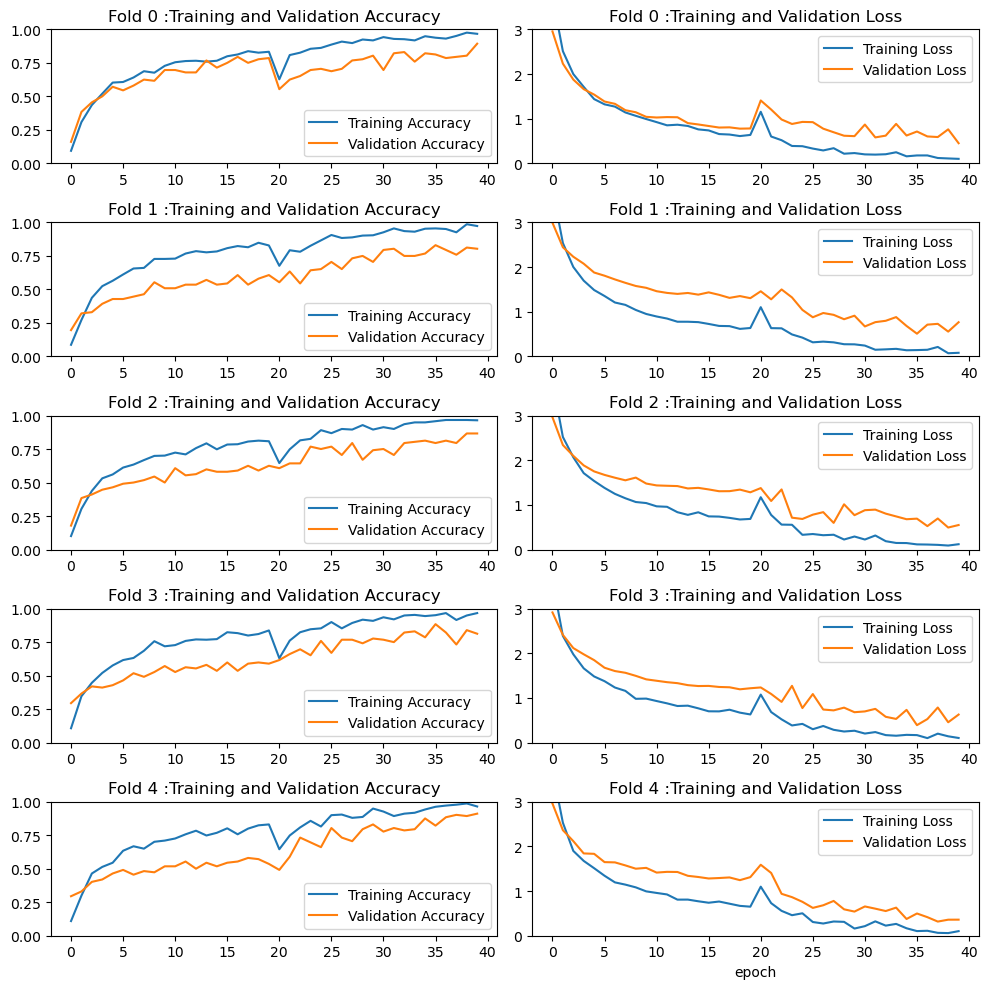

In [350]:
fig, ax = plt.subplots(5, 2, figsize=(10, 10))

for i in range(5):

    ax[i, 0].plot(acc_lst[i][0], label='Training Accuracy')
    ax[i, 0].plot(acc_lst[i][1], label='Validation Accuracy')
    ax[i, 0].set_ylim([0, 1])
    ax[i, 0].legend(loc='lower right')
    title = 'Fold {} :Training and Validation Accuracy'.format(i)
    ax[i, 0].set_title(title)
    plt.xlabel('epoch')
    
    ax[i, 1].plot(loss_lst[i][0], label='Training Loss')
    ax[i, 1].plot(loss_lst[i][1], label='Validation Loss')
    ax[i, 1].set_ylim([0, 3.0])
    ax[i, 1].legend(loc='upper right')
    title = 'Fold {} :Training and Validation Loss'.format(i)
    ax[i, 1].set_title(title)
    plt.xlabel('epoch')

plt.tight_layout()
plt.show()
    
    

Model of fold 4 demonstrated the best accuracy, let's use it on test set.

### Error Analysis on fold 4 model

In [357]:
def get_Xy_ds(indices):
    '''Get tensor ds from input index, 1. get_Xy; 2. read_image, resize on image_ds; 3. get one-hot label_ds; but does not shuffle or zip'''
    X, y = get_Xy(indices)
    
    image_ds = tf.data.Dataset.from_tensor_slices(X)
    image_ds = image_ds.map(read_image, num_parallel_calls=AUTOTUNE)
    image_ds = image_ds.map(resize, num_parallel_calls=AUTOTUNE)
    image_ds = image_ds.cache().prefetch(buffer_size=AUTOTUNE).batch(batch_size)
    
    label_ds = label[indices]

    return image_ds, label_ds

In [358]:
X_val, y_val = get_Xy_ds(val_index)

In [371]:
y_val_pred = model.predict(X_val)
y_val_pred = np.argmax(y_val_pred,axis = 1)

7/7 [==============================] - 3s 426ms/step


In [372]:
f1_score(y_val_pred, y_val, average = "macro")

0.8975056689342404

Then we will get the classification report, and see which label id are performing the worst.

In [405]:
cr = classification_report(y_val_pred, y_val, output_dict=True)
print('Macro f1 score:', f1_score(y_val_pred, y_val, average = "macro"))
cr_df = pd.DataFrame.from_dict(cr).T
cr_df[cr_df['f1-score']<0.8]

Macro f1 score: 0.8975056689342404


,precision,recall,f1-score,support
5,0.666667,0.666667,0.666667,3.0
6,0.666667,0.666667,0.666667,3.0
11,0.500000,1.000000,0.666667,1.0
34,0.666667,0.666667,0.666667,3.0
35,0.500000,0.333333,0.400000,3.0
36,0.500000,1.000000,0.666667,1.0
37,0.666667,0.666667,0.666667,3.0
39,0.500000,1.000000,0.666667,1.0


Labels 5,6,11,34-37 and 39 has a f1-score <0.8, let's try to get an insight from the corresponding images from the data set.

In [400]:
def extract_worst_f1(df, f1_thresold):
    '''A function to extract the index of worst performing labels. Extract the worst performing labels and store in a list.'''    
    global f1_list
    f1_list = df.iloc[:-3].index[df['f1-score'].iloc[:-3] < f1_thresold].astype("uint8").tolist()
    print('Worst performing labels with f1-scocre <',f1_thresold,'are:', f1_list)
   
    #Get the corresponding image indices of labels that performed poorly.
    test_df = pd.DataFrame(data = [y_test, indices_test], index =['label', 'index']).T
    test_df = test_df[test_df['label'].isin(f1_list)].sort_values('label')

    return test_df

In [518]:
#extract_worst_f1 on for getting image array and label array of input df with label and index
def get_f1_set (cr_df, f1_thresold, indices):
    '''Function to return (img_arr_f1, label_arr_f1, num_img), with given cr_df from classification report, f1-score thresold and corresponding indices'''
    global f1_list
    
    #Get the list of label_id with f1-score lower than thresold
    f1_list = cr_df.iloc[:-3].index[cr_df['f1-score'].iloc[:-3] < f1_thresold].astype("uint8").tolist()
    print('Worst performing labels with f1-scocre <',f1_thresold,'are:', f1_list)
   
    #Get the corresponding image indices of labels that performed poorly.
    df = pd.DataFrame(data = [label[indices], indices], index =['label', 'index']).T
    df = df[df['label'].isin(f1_list)].sort_values('label')
    print('List of labels and corresponding index in data set:')
    display(df)
    
    img_lst_f1 = []
    label_lst_f1 = []
    
    #Append all images (those with f1-score < thresold) to list img_lst_f1
    for index in df['index']:
        img_lst_f1.append(images[index])
    img_arr_f1 = np.array(img_lst_f1, dtype=object)
    print('No. of images in test set  with f1-scocre <',f1_thresold, img_arr_f1.shape[0])
    
    #Append all labels (those with f1-score < thresold) to list img_lst_f1
    for index in df['index']:
        label_lst_f1.append(label[index])
        
    label_arr_f1 = np.array(label_lst_f1, dtype =object)
    num_img = len(img_arr_f1)
    
    return img_arr_f1, label_arr_f1, num_img

In [426]:
def display_image(images,labels, num_img):
    for n, (image, label) in enumerate(zip(images[:num_img],labels[:num_img])):
        
        num_rows = math.ceil(math.sqrt(num_img))
        if num_rows >= 4:
            num_rows = 4
            num_cols = math.ceil(num_img/num_rows)
        else:
            num_cols = math.ceil(num_img/num_rows)
        
        plt.subplot(num_rows, num_cols, n+1)
        plt.imshow(image.astype("uint8"))
        plt.grid(False)
        plt.xticks([])
        plt.yticks([])
        
        plt.xlabel('Label_ID: '+ str(label))
        plt.tight_layout()
    plt.show()


In [430]:
f1_thresold = 0.8
val_img, val_label, num_img = get_f1_set(cr_df, f1_thresold)

Worst performing labels with f1-scocre < 0.8 are: [5, 6, 11, 34, 35, 36, 37, 39]
No. of images in test set  with f1-scocre < 0.8 25


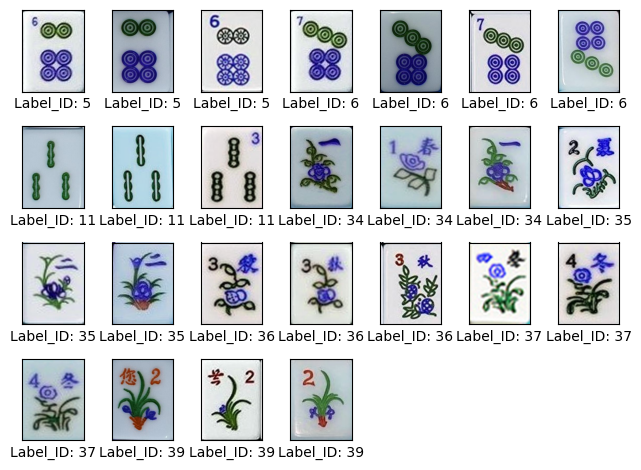

In [427]:
display_image(val_img, val_label, num_img)

Nothing abnormal observed from the validation set. </br>
Now we will try to display all images of labels that didn't perform perfectly in validation set.

In [428]:
#Define a new function to display all images from a label
def display_image_label(label):
    img_arr_withlabel = []
    img_index = mj_df.index[mj_df['label_id'] == label]
    print(img_index)
    for i in img_index:
        img_arr_withlabel.append(images[i])
    label_arr = np.full(len(img_index), label)
    display_image(img_arr_withlabel, label_arr, len(label_arr))

In [431]:
f1_thresold = 1
val_img, val_label, num_img = get_f1_set(cr_df, f1_thresold)

Worst performing labels with f1-scocre < 1 are: [5, 6, 10, 11, 12, 14, 19, 20, 24, 25, 34, 35, 36, 37, 39, 41]
No. of images in test set  with f1-scocre < 1 50


Int64Index([ 26,  47,  60, 111, 167, 196, 238, 280, 332, 358, 400, 420, 487,
            525, 567, 612, 661],
           dtype='int64')


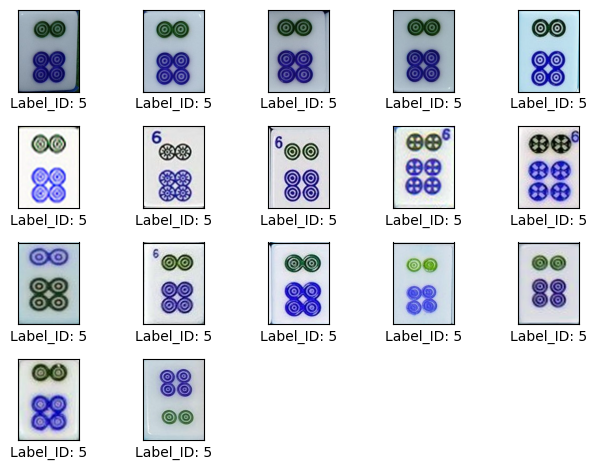

Int64Index([ 25,  45,  89, 101, 166, 192, 250, 277, 331, 355, 397, 421, 484,
            522, 564, 609, 628, 662],
           dtype='int64')


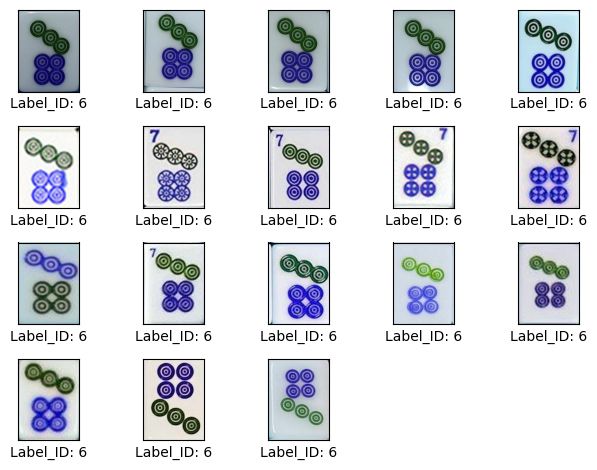

Int64Index([68, 130, 137, 162, 195, 231, 291, 303, 369, 411, 457, 498, 536,
            578, 623, 666],
           dtype='int64')


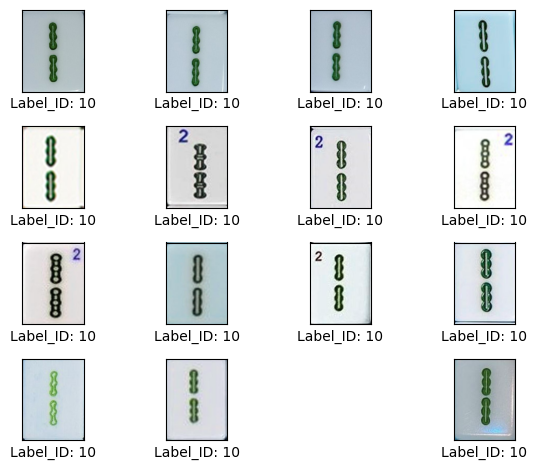

Int64Index([ 29,  54,  77, 133, 161, 191, 243, 288, 298, 366, 408, 458, 495,
            533, 575, 620, 667],
           dtype='int64')


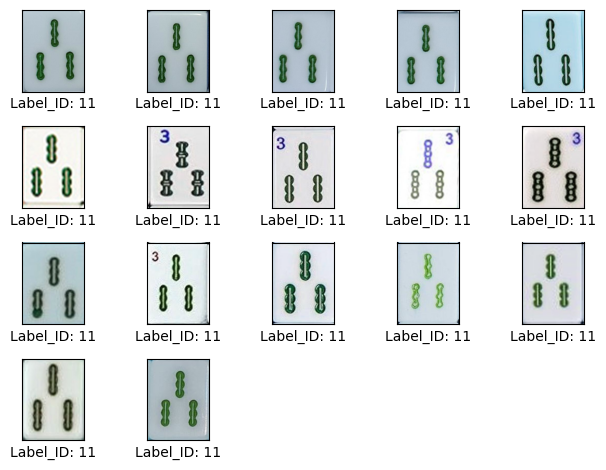

Int64Index([ 69,  70,  87, 117, 160, 187, 241, 285, 297, 363, 405, 459, 492,
            530, 572, 617, 668],
           dtype='int64')


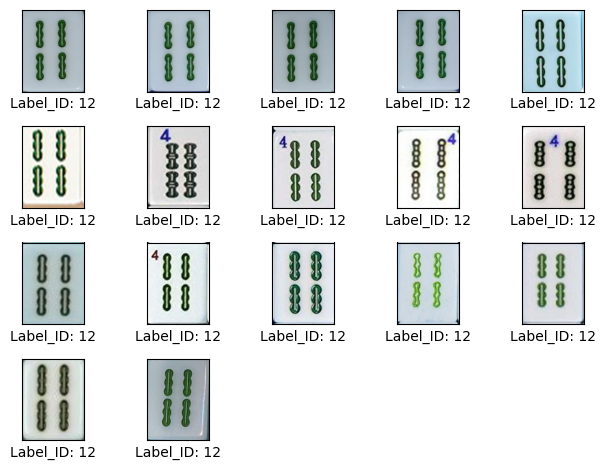

Int64Index([ 59,  72,  79, 100, 158, 198, 230, 279, 301, 357, 399, 447, 486,
            524, 566, 611, 670],
           dtype='int64')


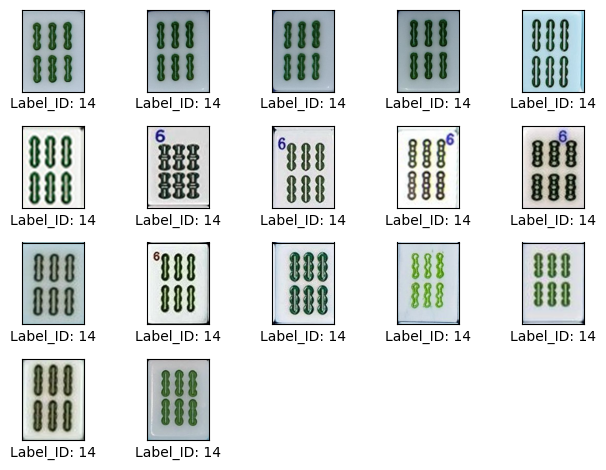

Int64Index([ 10,  65,  88, 106, 180, 217, 234, 290, 327, 368, 410, 453, 497,
            535, 577, 622, 648],
           dtype='int64')


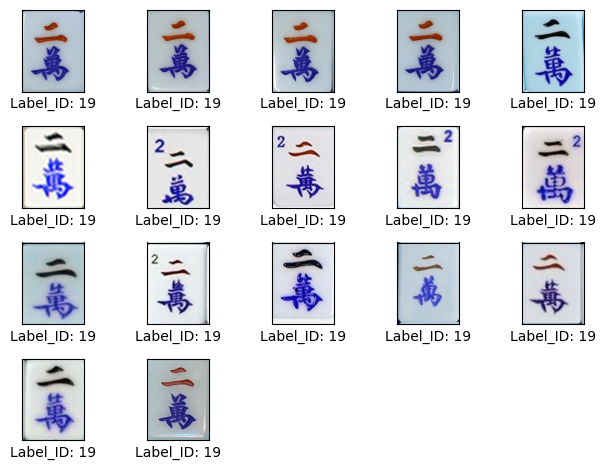

Int64Index([48, 82, 84, 179, 213, 245, 287, 326, 365, 407, 454, 494, 532, 574,
            619, 649],
           dtype='int64')


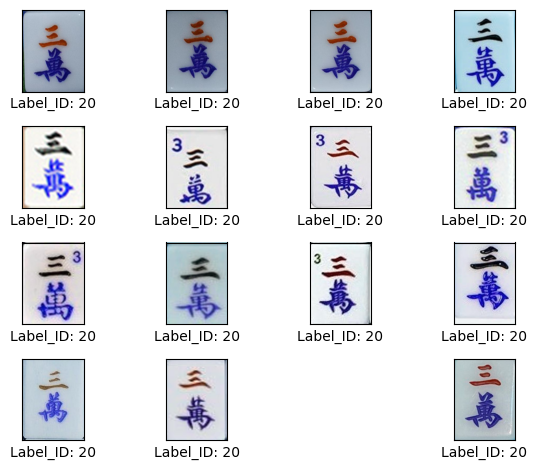

Int64Index([ 24,  30, 131, 136, 175, 216, 226, 275, 322, 353, 395, 444, 482,
            520, 562, 607, 653],
           dtype='int64')


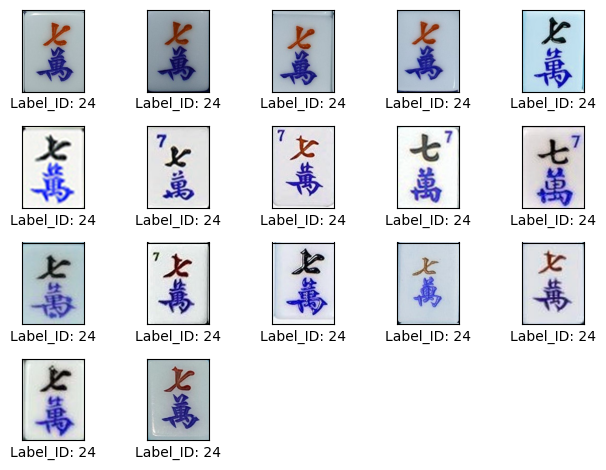

Int64Index([1, 11, 39, 174, 212, 236, 272, 321, 350, 392, 445, 479, 517, 559,
            604, 654, 678],
           dtype='int64')


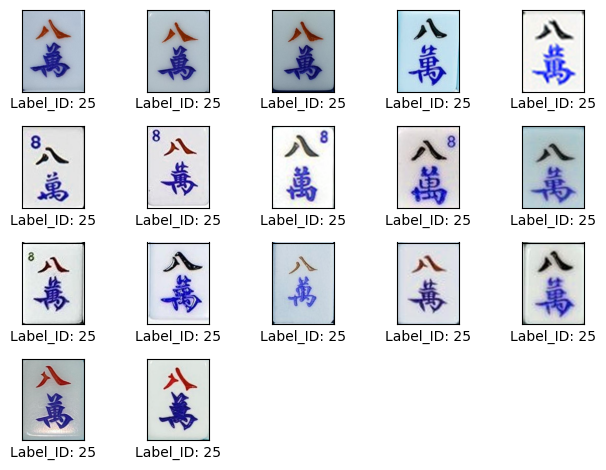

Int64Index([135, 154, 210, 256, 260, 312, 340, 381, 426, 468, 544, 589, 638,
            683],
           dtype='int64')


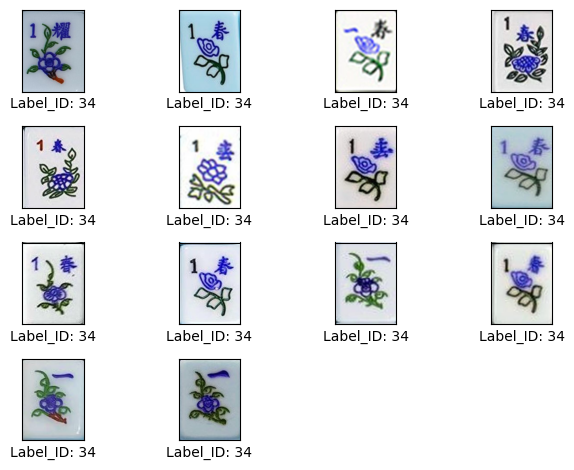

Int64Index([3, 153, 209, 253, 261, 311, 342, 380, 425, 467, 543, 588, 637, 684,
            690],
           dtype='int64')


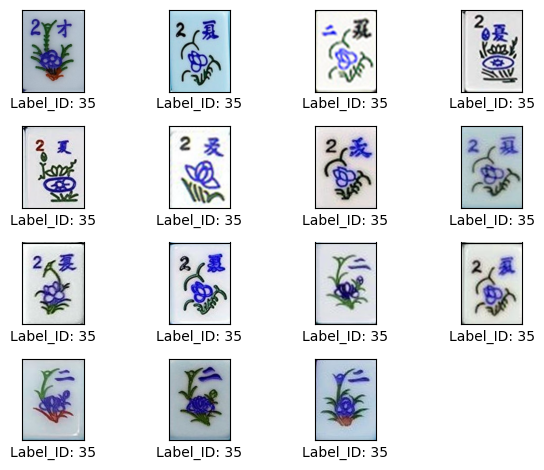

Int64Index([5, 152, 208, 252, 262, 310, 341, 379, 424, 466, 542, 587, 636, 685,
            691],
           dtype='int64')


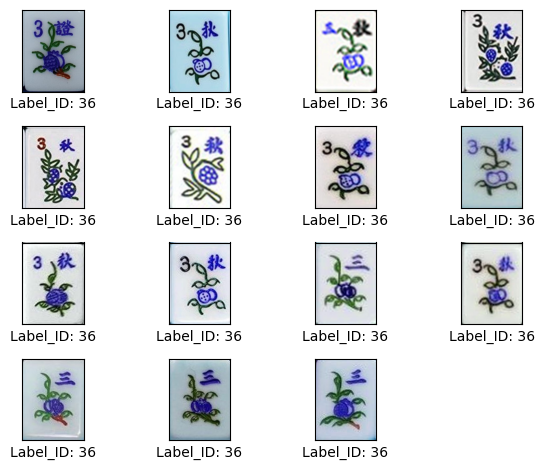

Int64Index([0, 151, 207, 251, 263, 309, 343, 378, 419, 465, 541, 586, 629, 635,
            686, 692],
           dtype='int64')


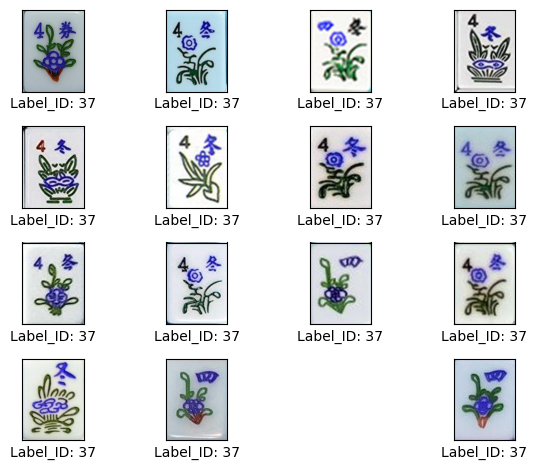

Int64Index([138, 149, 202, 307, 376, 441, 463, 505, 547, 592, 633, 680, 687], dtype='int64')


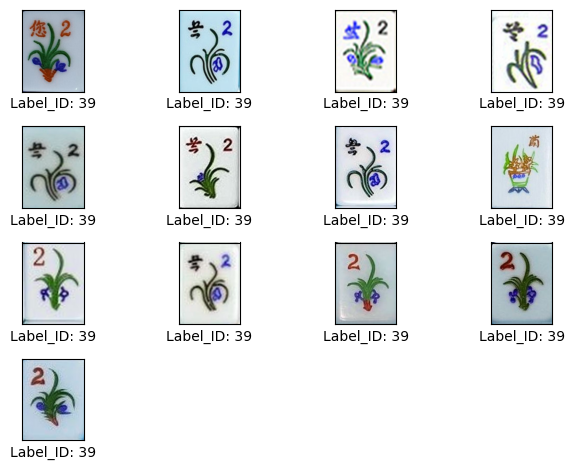

Int64Index([94, 148, 200, 305, 374, 435, 461, 503, 545, 590, 631, 682, 689], dtype='int64')


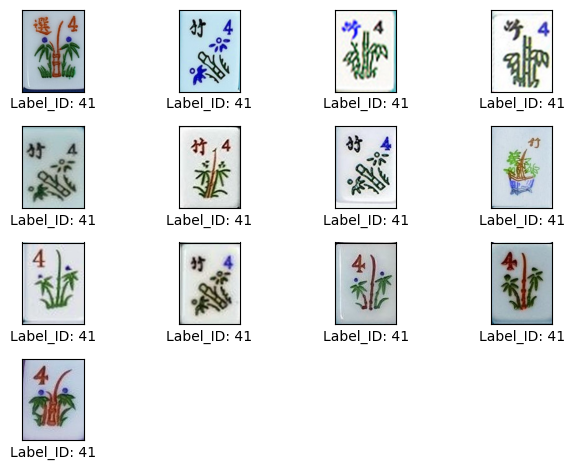

In [432]:
#Display all images of labels we got in f1_list, which is obtained from the function worst_f1_extract
for i in f1_list:
    display_image_label(i)

Some of the images in label id 5 and 6 has been rotated by 180 degrees, but this should have taken into account during training with data augmentation of RandomRotation.

## Model Enhancement with dropout

In [451]:
inputs = tf.keras.Input(shape=(224, 224, 3))

x = data_augmentation(inputs)
print(x.shape)
      
x = preprocess_input(x)
print(x.shape)

x = base_model(x, training=False)
print(x.shape)

x = global_average_layer(x)
print(x.shape)

x = tf.keras.layers.Dropout(0.1)(x)
print(x.shape)

outputs = prediction_layer(x)

print('Output has a dimension of: ' + str(outputs.shape))
model = tf.keras.Model(inputs, outputs)

(None, 224, 224, 3)
(None, 224, 224, 3)
(None, 7, 7, 1280)
(None, 1280)
(None, 1280)
Output has a dimension of: (None, 42)


In [454]:
total_epochs = 0
acc = []
val_acc = []
loss = []
val_loss = []
acc_tuple = ()
loss_tuple = ()
acc_drop_performance =[]
loss_drop_performance = []

fold = 0


In [455]:
for train_index, val_index in skf.split(indices_trainval, label[indices_trainval]):
    
    train_index= np.take(indices_trainval, train_index)
    val_index= np.take(indices_trainval, val_index)
    
    train_ds = get_ds(train_index)
    val_ds = get_ds(val_index)
    
    base_model.trainable = False
    base_learning_rate = 0.001   
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=base_learning_rate),
              loss=tf.keras.losses.CategoricalCrossentropy(from_logits = False),
              metrics=['accuracy'] )    
    
    model.reset_states()
    model.load_weights('model.h5')
   
    total_epochs = 0
    
    epochs = 20
    cp_callback = tf.keras.callbacks.ModelCheckpoint(f"weights-drop-{fold}.hdf5", save_best_only=True, save_weights_only=True)
    early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=5, mode='max', min_delta=0.01, restore_best_weights=True)
    
    print('Fold {} output layers training'.format(fold))
    
    history = model.fit(train_ds,  
                        validation_data=val_ds,
                        epochs = epochs,
                        callbacks=[cp_callback]
                        )
    callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
    
    total_epochs += epochs
    
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    acc_tuple = (fold, acc, val_acc)
    acc_drop_performance.append(acc_tuple)

    loss = history.history['loss']
    val_loss = history.history['val_loss']
    loss_tuple = (fold, loss,val_loss)
    loss_drop_performance.append(loss_tuple)
    

    #Base model layer training

#Set base model to trainable
    base_model.trainable = True

    # Fine-tune from this layer onwards
    #fine_tune_at = 70

    # Freeze all the layers before the `fine_tune_at` layer
   # for layer in base_model.layers[:fine_tune_at]:
   #   layer.trainable = False

    #Compile to model again
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=base_learning_rate/10),
              loss=tf.keras.losses.CategoricalCrossentropy(from_logits = False),
              metrics=['accuracy'] )
    
    cp_callback = tf.keras.callbacks.ModelCheckpoint(f"weights-fine-drop-{fold}.hdf5", save_best_only=True, save_weights_only=True)

#Continue training
    print('Fold {} base model training'.format(fold))
    
    epochs = 30
    history = model.fit(train_ds,  
                        validation_data=val_ds,
                        epochs = total_epochs + epochs,
                        initial_epoch = total_epochs,
                        callbacks=[cp_callback, early_stopping]
                        )
    callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
    
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    acc_tuple = (fold, acc, val_acc)
    acc_drop_performance.append(acc_tuple)

    loss = history.history['loss']
    val_loss = history.history['val_loss']
    loss_tuple = (fold, loss,val_loss)
    loss_drop_performance.append(loss_tuple)
    
    fold += 1

Fold 0 output layers training
Epoch 1/20
28/28 [==============================] - 31s 635ms/step - loss: 3.8135 - accuracy: 0.0692 - val_loss: 2.8579 - val_accuracy: 0.2500
Epoch 2/20
28/28 [==============================] - 17s 611ms/step - loss: 2.6007 - accuracy: 0.2746 - val_loss: 2.3049 - val_accuracy: 0.3661
Epoch 3/20
28/28 [==============================] - 17s 613ms/step - loss: 2.1136 - accuracy: 0.3772 - val_loss: 2.0059 - val_accuracy: 0.4286
Epoch 4/20
28/28 [==============================] - 15s 528ms/step - loss: 1.7676 - accuracy: 0.4844 - val_loss: 1.8279 - val_accuracy: 0.4286
Epoch 5/20
28/28 [==============================] - 15s 544ms/step - loss: 1.5524 - accuracy: 0.5603 - val_loss: 1.6890 - val_accuracy: 0.4821
Epoch 6/20
28/28 [==============================] - 16s 581ms/step - loss: 1.4421 - accuracy: 0.5536 - val_loss: 1.6176 - val_accuracy: 0.5089
Epoch 7/20
28/28 [==============================] - 16s 579ms/step - loss: 1.2305 - accuracy: 0.6853 - val_loss:

In [458]:
acc_drop_lst = performance_to_list(acc_drop_performance)
loss_drop_lst = performance_to_list(loss_drop_performance)

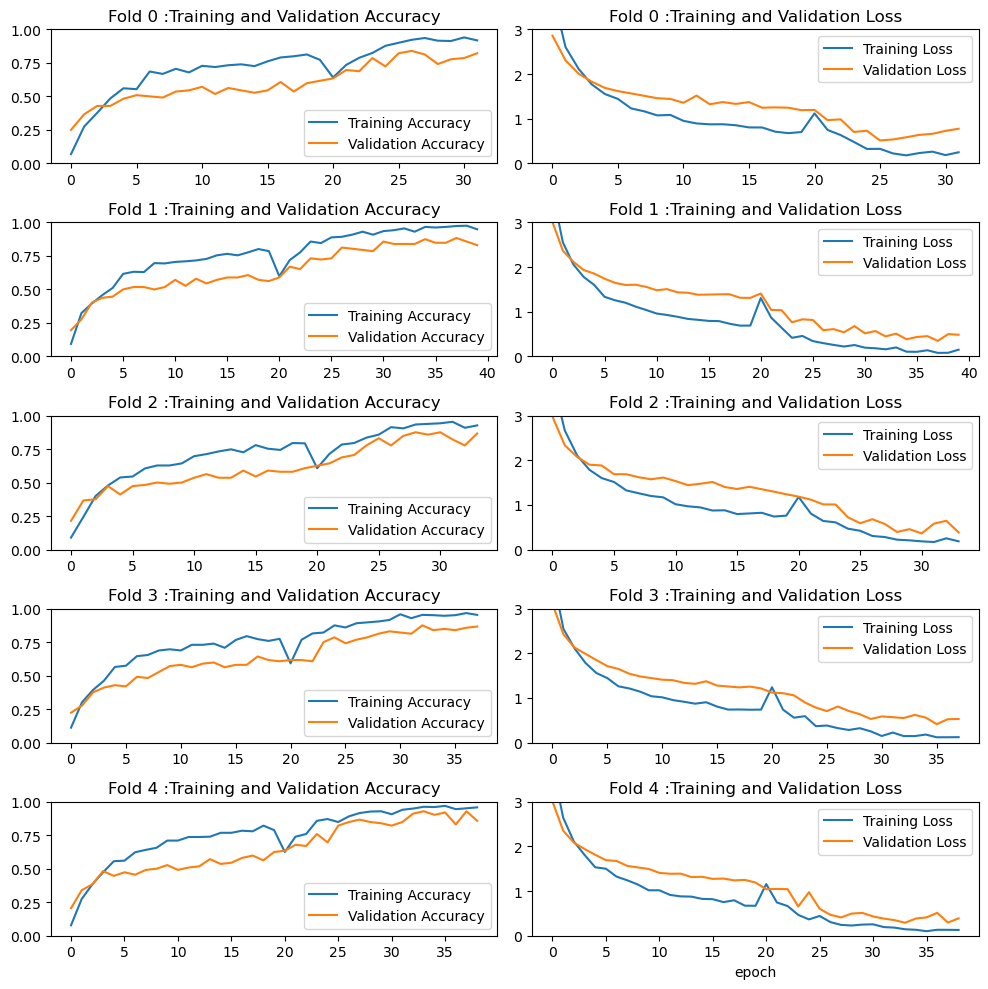

In [459]:
fig, ax = plt.subplots(5, 2, figsize=(10, 10))

for i in range(5):

    ax[i, 0].plot(acc_drop_lst[i][0], label='Training Accuracy')
    ax[i, 0].plot(acc_drop_lst[i][1], label='Validation Accuracy')
    ax[i, 0].set_ylim([0, 1])
    ax[i, 0].legend(loc='lower right')
    title = 'Fold {} :Training and Validation Accuracy'.format(i)
    ax[i, 0].set_title(title)
    plt.xlabel('epoch')
    
    ax[i, 1].plot(loss_drop_lst[i][0], label='Training Loss')
    ax[i, 1].plot(loss_drop_lst[i][1], label='Validation Loss')
    ax[i, 1].set_ylim([0, 3.0])
    ax[i, 1].legend(loc='upper right')
    title = 'Fold {} :Training and Validation Loss'.format(i)
    ax[i, 1].set_title(title)
    plt.xlabel('epoch')

plt.tight_layout()
plt.show()
    
    

## Model Prediction and Error Analysis

In [460]:
indices_test

array([274, 429, 515, 699, 443, 197, 272, 683, 621, 504, 215, 508, 110,
       662, 341, 124, 207, 351, 439, 486, 395, 368, 441, 427, 138, 454,
       689, 244, 378, 173, 105, 633, 404, 211, 690, 383, 461, 512, 679,
       333, 677, 366,  30, 226,  84, 381, 198, 434, 185, 325, 177, 539,
       213, 387, 519, 308, 117, 176, 363, 238, 360,  80, 277,   7, 371,
       122, 141, 608,  41, 286, 164, 382, 646, 343,  25,  57, 436, 195,
       109, 356, 531, 693, 269, 511,  18, 568, 347, 438, 602, 697, 467,
       665, 330, 142,  60, 582, 622, 415, 222, 546, 421, 587, 670, 318,
       558, 538, 369, 392, 155, 220, 535, 291,  75, 638, 161, 391, 262,
       133, 294, 234, 527, 695, 302, 449, 645, 409, 543, 292, 500, 416,
       187, 440, 190, 625,  15, 517, 420, 257, 362, 148])

In [474]:
X_test, y_test = get_Xy_ds(indices_test)

array([ 7,  0, 17, 30, 23,  0, 25, 34,  2, 40, 28, 30, 28,  6, 36, 15, 37,
       16,  4, 14, 24, 19, 39, 33, 39, 20, 41, 33, 37, 26, 13, 39, 21, 29,
       35, 30, 41, 27, 38,  4,  9, 11, 24, 24, 20, 34, 14, 29, 17, 21, 22,
        9, 20, 27,  7, 38, 12, 23, 12,  5, 13, 30,  6, 15, 18,  0, 32, 15,
       23,  3,  8, 33, 33, 37,  6,  4,  1, 10, 27, 23,  3, 31, 26, 29,  1,
       22, 26,  3, 17, 28, 35,  9,  7, 31,  5,  0, 19,  0, 22, 40,  6, 36,
       14, 28,  8, 18, 10, 25, 17, 27, 19, 10,  7, 34, 11,  8, 36, 11,  9,
       19, 13, 32, 13, 16, 32,  2, 35,  1, 18, 31, 12, 40, 16, 18,  2, 25,
        5, 29, 21, 41], dtype=int64)

In [462]:
y_pred = model.predict(X_test)

9/9 [==============================] - 6s 384ms/step


In [466]:
y_pred = np.argmax(y_pred, axis=1)

In [ ]:
y_test = label[indices_test]
y_test

array([ 7,  0, 17, 30, 23,  0, 25, 34,  2, 40, 28, 30, 28,  6, 36, 15, 37,
       16,  4, 14, 24, 19, 39, 33, 39, 20, 41, 33, 37, 26, 13, 39, 21, 29,
       35, 30, 41, 27, 38,  4,  9, 11, 24, 24, 20, 34, 14, 29, 17, 21, 22,
        9, 20, 27,  7, 38, 12, 23, 12,  5, 13, 30,  6, 15, 18,  0, 32, 15,
       23,  3,  8, 33, 33, 37,  6,  4,  1, 10, 27, 23,  3, 31, 26, 29,  1,
       22, 26,  3, 17, 28, 35,  9,  7, 31,  5,  0, 19,  0, 22, 40,  6, 36,
       14, 28,  8, 18, 10, 25, 17, 27, 19, 10,  7, 34, 11,  8, 36, 11,  9,
       19, 13, 32, 13, 16, 32,  2, 35,  1, 18, 31, 12, 40, 16, 18,  2, 25,
        5, 29, 21, 41], dtype=int64)

In [475]:
f1_score(y_test, y_pred, average = 'macro')

0.8606009070294783

In [479]:
X_val, y_val = get_Xy_ds(val_index)

In [480]:
y_val_pred = model.predict(X_val)
y_val_pred = np.argmax(y_val_pred,axis = 1)

7/7 [==============================] - 4s 372ms/step


In [481]:
f1_score(y_val_pred, y_val, average = "macro")

0.9165532879818594

In [490]:
f1_list = cr_df.iloc[:-3].index[cr_df['f1-score'].iloc[:-3] < f1_thresold].astype("uint8").tolist()
print('Worst performing labels with f1-scocre <',f1_thresold,'are:', f1_list)

#Get the corresponding image indices of labels that performed poorly.
#df = pd.DataFrame(data = [y_test, indices_test], index =['label', 'index']).T
#df = df[df['label'].isin(f1_list)].sort_values('label')

Worst performing labels with f1-scocre < 0.8 are: [5, 6, 30, 36, 39]


In [501]:
[y_val, val_index]

[array([ 4, 18, 15, 13, 34,  6, 34,  4, 20, 40, 24, 15, 12, 35, 25, 16, 16,
        26,  3, 20, 11, 32,  9,  6, 21, 22, 11,  0,  1, 25, 14, 19, 19, 10,
        17, 10, 28, 26,  7, 17,  8, 29, 28, 28, 23, 37,  5,  1, 39, 30, 14,
         3, 15, 41, 14, 34,  0, 36,  1, 18,  5, 19, 40, 31, 13, 26,  5, 27,
        12, 32,  0, 37, 18,  6,  7, 41, 27, 21,  2, 24, 22, 33, 24, 38, 10,
         9, 30, 39, 22, 35, 13, 37,  4, 25,  9, 12,  2, 27, 33, 31, 33, 29,
         7, 21,  0,  8,  8, 36, 23, 20, 38,  2], dtype=int64),
 array([528,  50, 521, 159, 340, 609, 154, 660, 649, 375,  24, 671, 530,
        684, 321, 672,  58,  40, 406, 245, 288, 314,  73, 331, 284,  21,
        533, 585, 336, 678, 100, 290, 648, 303,  85, 130, 232, 556, 165,
        477, 603,   9, 471, 640,  53, 465, 111, 657, 592,   8, 230, 364,
        240, 631, 399, 589, 430, 542,  61, 647, 525,  10, 681, 644, 614,
        476, 358, 146, 617, 125, 675, 251, 181, 564, 663,  94, 599, 616,
        576, 131,  13, 214, 482,  36, 162, 

In [503]:
label[val_index]

array([ 4, 18, 15, 13, 34,  6, 34,  4, 20, 40, 24, 15, 12, 35, 25, 16, 16,
       26,  3, 20, 11, 32,  9,  6, 21, 22, 11,  0,  1, 25, 14, 19, 19, 10,
       17, 10, 28, 26,  7, 17,  8, 29, 28, 28, 23, 37,  5,  1, 39, 30, 14,
        3, 15, 41, 14, 34,  0, 36,  1, 18,  5, 19, 40, 31, 13, 26,  5, 27,
       12, 32,  0, 37, 18,  6,  7, 41, 27, 21,  2, 24, 22, 33, 24, 38, 10,
        9, 30, 39, 22, 35, 13, 37,  4, 25,  9, 12,  2, 27, 33, 31, 33, 29,
        7, 21,  0,  8,  8, 36, 23, 20, 38,  2], dtype=int64)

In [518]:
#extract_worst_f1 on for getting image array and label array of input df with label and index
def get_f1_set (cr_df, f1_thresold, indices):
    '''Function to return (img_arr_f1, label_arr_f1, num_img), with given cr_df from classification report, f1-score thresold and corresponding indices'''
    global f1_list
    
    #Get the list of label_id with f1-score lower than thresold
    f1_list = cr_df.iloc[:-3].index[cr_df['f1-score'].iloc[:-3] < f1_thresold].astype("uint8").tolist()
    print('Worst performing labels with f1-scocre <',f1_thresold,'are:', f1_list)
   
    #Get the corresponding image indices of labels that performed poorly.
    df = pd.DataFrame(data = [label[indices], indices], index =['label', 'index']).T
    df = df[df['label'].isin(f1_list)].sort_values('label')
    print('List of labels and corresponding index in data set:')
    display(df)
    
    img_lst_f1 = []
    label_lst_f1 = []
    
    #Append all images (those with f1-score < thresold) to list img_lst_f1
    for index in df['index']:
        img_lst_f1.append(images[index])
    img_arr_f1 = np.array(img_lst_f1, dtype=object)
    print('No. of images in test set  with f1-scocre <',f1_thresold, img_arr_f1.shape[0])
    
    #Append all labels (those with f1-score < thresold) to list img_lst_f1
    for index in df['index']:
        label_lst_f1.append(label[index])
        
    label_arr_f1 = np.array(label_lst_f1, dtype =object)
    num_img = len(img_arr_f1)
    
    return img_arr_f1, label_arr_f1, num_img

In [515]:
cr = classification_report(y_val, y_val_pred, output_dict=True)#, target_names=np.argmax(y_true, axis = 1)
print('Macro f1 score:', f1_score(y_val,y_val_pred , average = 'macro'))
cr_df = pd.DataFrame.from_dict(cr).T
display(cr_df[cr_df['f1-score']<0.8])

Macro f1 score: 0.9165532879818594


C:\Users\Justin\anaconda3\envs\Python\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Justin\anaconda3\envs\Python\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Justin\anaconda3\envs\Python\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,precision,recall,f1-score,support
5,0.5,1.0,0.666667,3.0
6,0.0,0.0,0.000000,3.0
30,1.0,0.5,0.666667,2.0
36,1.0,0.5,0.666667,2.0
39,1.0,0.5,0.666667,2.0


In [517]:
f1_thresold = 0.8
val_img, val_label, num_img = get_f1_set(cr_df, f1_thresold, val_index)

Worst performing labels with f1-scocre < 0.8 are: [5, 6, 30, 36, 39]
List of labels and corresponding index in data set


,label,index
46,5,111
60,5,525
66,5,358
5,6,609
23,6,331
73,6,564
49,30,8
86,30,338
57,36,542
107,36,5


No. of images in test set  with f1-scocre < 0.8 12


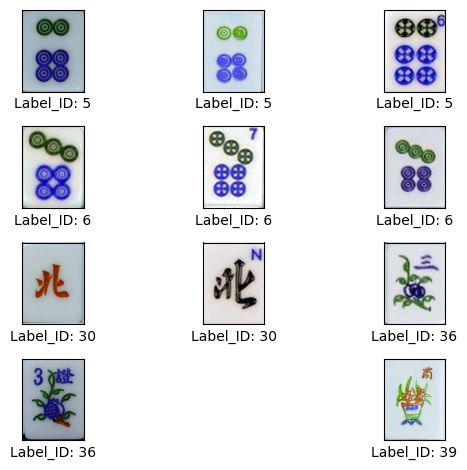

In [510]:
display_image(val_img, val_label, num_img)

### Model Prediction (with test set)

In [478]:
cr = classification_report(y_test, y_pred, output_dict=True)#, target_names=np.argmax(y_true, axis = 1)
print('Macro f1 score:', f1_score(y_test, y_pred, average = 'macro'))
cr_df = pd.DataFrame.from_dict(cr).T
display(cr_df[cr_df['f1-score']<0.8])

Macro f1 score: 0.8606009070294783


,precision,recall,f1-score,support
5,0.400000,0.666667,0.500000,3.0
6,0.500000,0.250000,0.333333,4.0
19,0.750000,0.750000,0.750000,4.0
20,0.666667,0.666667,0.666667,3.0
23,0.750000,0.750000,0.750000,4.0
34,0.500000,0.333333,0.400000,3.0
35,0.600000,1.000000,0.750000,3.0
36,0.666667,0.666667,0.666667,3.0
38,1.000000,0.500000,0.666667,2.0
40,0.666667,0.666667,0.666667,3.0


The model performed the worst on label 7, with f1-score of 0, whereas 5,19,34,40 has a f1-score <0.5.

After training the output layer, we will also train the base model.

### Model Evaluation

The macro f1 score improved from ~0.76 to ~0.85 with tuning of base model.

## Error Analysis

Let's check and see which labels are performing particularly bad.

We will try to find out which labels performed particularly bad by the model, with f1-score < 0.７

In [50]:
cr_base = classification_report(y_test , y_pred_base, output_dict=True)
rpt_base = pd.DataFrame.from_dict(cr_base).T

In [51]:
rpt_base[rpt_base['f1-score'] < 0.7]

,precision,recall,f1-score,support
5,0.400000,0.666667,0.500000,3.0
7,1.000000,0.333333,0.500000,3.0
20,0.666667,0.666667,0.666667,3.0
34,0.500000,0.333333,0.400000,3.0
36,0.333333,0.666667,0.444444,3.0
37,0.500000,0.333333,0.400000,3.0
38,1.000000,0.500000,0.666667,2.0
40,0.333333,0.333333,0.333333,3.0


Labels 5,13,20,34,36-40 has a f1-score <0.7, let's try to get an insight from the corresponding images from the data set.

In [21]:
def extract_worst_f1(df, f1_thresold):
    '''A function to extract the index of worst performing labels. Extract the worst performing labels and store in a list.'''    
    global f1_list
    f1_list = df.iloc[:-3].index[df['f1-score'].iloc[:-3] < f1_thresold].astype("uint8").tolist()
    print('Worst performing labels with f1-scocre <',f1_thresold,'are:', f1_list)
    #Get the corresponding image indices of labels that performed poorly.
    test_df = pd.DataFrame(data = [y_test, indices_test], index =['label', 'index']).T
    test_df = test_df[test_df['label'].isin(f1_list)].sort_values('label')
    #display(test_df)
    return test_df

In [53]:
#extract_worst_f1on for getting imgage array and label array of input df with label and index
def f1_array (df):
    img_lst_f1 = []
    label_lst_f1 = []
    
    for index in df['index']:
        img_lst_f1.append(img_arr[index])
    img_arr_f1 = np.array(img_lst_f1, dtype=object)
    print('No. of images in test set  with f1-scocre <',f1_thresold, img_arr_f1.shape[0])
    
    for index in df['index']:
        label_lst_f1.append(label[index])
        
    label_arr_f1 = np.array(label_lst_f1, dtype =object)
    num_img = len(img_arr_f1)
    
    return img_arr_f1, label_arr_f1, num_img

In [54]:
f1_thresold = 0.7
lowf1_df = extract_worst_f1(rpt_base, f1_thresold)

Worst performing labels with f1-scocre < 0.7 are: [5, 7, 20, 34, 36, 37, 38, 40]


In [55]:
f1_img, f1_label, num_img = f1_array(lowf1_df)

No. of images in test set  with f1-scocre < 0.7 26


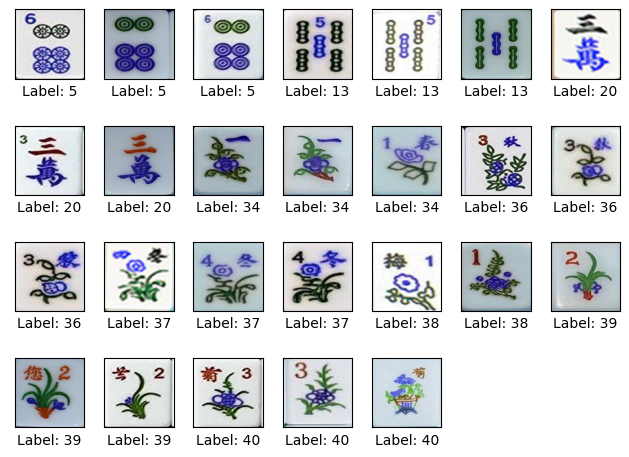

In [56]:
display_image(f1_img, f1_label, num_img)

With reference to the displayed photos, it is noticed that the images of label 34-41 (bonus) could vary significantly, hence affecting the accuracy. Similar observation is found on label 34-41 for all bonuses.</br>
For other labels, it is suspected that the arabic numerals at top left/right corners might have led to the low accuracy. As such, try adding a RandomTranslation layer to images so the upper most part of images would be out of training data.

## Training Model again, with RandomTranslation for data augmentation

In [55]:
#New layer of RandomTranslation added to data, which potentially shift image upward by 20%
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()
prediction_layer = tf.keras.layers.Dense(num_classes, activation='softmax')
preprocess_input = tf.keras.applications.mobilenet_v2.preprocess_input
data_augmentation = tf.keras.Sequential([
  layers.RandomZoom(.2,.2),
  #layers.RandomRotation(0.3),
  #layers.RandomFlip("horizontal_and_vertical"),  
  layers.RandomContrast(0.3),
  layers.RandomTranslation(height_factor = (-0.2,0), width_factor = 0.2, fill_mode = 'nearest')
])

In [56]:
checkpoint_path = "training_3/cp.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)
cp_callback = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,
                                                 save_weights_only=True,
                                                 verbose=1)

In [61]:
inputs = tf.keras.Input(shape=(224, 224, 3))
x = data_augmentation(inputs)
print(x.shape)

x = preprocess_input(x)
print(x.shape)

x = base_model(x, training=False)
print(x.shape)

x = global_average_layer(x)
print(x.shape)

outputs = prediction_layer(x)

print('Output has a dimension of: ' + str(outputs.shape))
model = tf.keras.Model(inputs, outputs)

(None, 224, 224, 3)
(None, 224, 224, 3)
(None, 7, 7, 1280)
(None, 1280)
Output has a dimension of: (None, 42)


In [62]:
model.compile(optimizer=tf.keras.optimizers.Adam(base_learning_rate/100),
              loss=tf.keras.losses.CategoricalCrossentropy(from_logits = False),
              metrics=['accuracy'] )
model.load_weights("training_2/cp.ckpt")
model.summary()



Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 sequential_1 (Sequential)   (None, 224, 224, 3)       0         
                                                                 
 tf.math.truediv_2 (TFOpLamb  (None, 224, 224, 3)      0         
 da)                                                             
                                                                 
 tf.math.subtract_2 (TFOpLam  (None, 224, 224, 3)      0         
 bda)                                                            
                                                                 
 mobilenetv2_1.00_224 (Funct  (None, 7, 7, 1280)       2257984   
 ional)                                                          
                                                           

In [63]:
batch_size = 16
acc_3 = []
val_acc_3 = []
loss_3 = []
val_loss_3 = []
total_epochs = 80
for train_index, val_index in skf.split(img_train, label_train):
    X_train, X_val = img_train[train_index].astype('f'), img_train[val_index].astype('f')
    y_train, y_val = tf.keras.utils.to_categorical(label_train[train_index], num_classes=None, dtype='float32'),\
                     tf.keras.utils.to_categorical(label_train[val_index], num_classes=None, dtype='float32')
    train_ds = tf.data.Dataset.from_tensor_slices((X_train, y_train)).batch(batch_size)
    val_ds = tf.data.Dataset.from_tensor_slices((X_val, y_val)).batch(batch_size)
    train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
    val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

    epochs = 5
    print('Before', total_epochs)
    history_3 = model.fit(train_ds,  
                             validation_data=val_ds,
                             epochs = total_epochs + epochs,
                             initial_epoch= total_epochs,
                             callbacks=[cp_callback]
                                )
    total_epochs += epochs
    print('After', total_epochs)
#    else:
#        history = model.fit(train_ds,  
 #                           validation_data=test_ds,
 #                           epochs = epochs,
  #                          initial_epoch=history.epoch[-1]
#    )
    callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
    acc_3 += history_3.history['accuracy']
    val_acc_3 += history_3.history['val_accuracy']

    loss_3 += history_3.history['loss']
    val_loss_3 += history_3.history['val_loss']

Before 80
Epoch 81/85
27/27 [==============================] - ETA: 0s - loss: 0.0659 - accuracy: 0.9810
Epoch 81: saving model to training_3\cp.ckpt
27/27 [==============================] - 35s 774ms/step - loss: 0.0659 - accuracy: 0.9810 - val_loss: 0.0213 - val_accuracy: 1.0000
Epoch 82/85
27/27 [==============================] - ETA: 0s - loss: 0.0870 - accuracy: 0.9667
Epoch 82: saving model to training_3\cp.ckpt
27/27 [==============================] - 20s 758ms/step - loss: 0.0870 - accuracy: 0.9667 - val_loss: 0.0137 - val_accuracy: 1.0000
Epoch 83/85
27/27 [==============================] - ETA: 0s - loss: 0.0728 - accuracy: 0.9833
Epoch 83: saving model to training_3\cp.ckpt
27/27 [==============================] - 20s 742ms/step - loss: 0.0728 - accuracy: 0.9833 - val_loss: 0.0092 - val_accuracy: 1.0000
Epoch 84/85
27/27 [==============================] - ETA: 0s - loss: 0.0416 - accuracy: 0.9905
Epoch 84: saving model to training_3\cp.ckpt
27/27 [===========================

In [64]:
y_pred_3 = model.predict(X_test.astype('f'))
y_pred_3 = np.argmax(y_pred_3, axis=1)
print('Macro f1 score with base model training:', f1_score(y_test, y_pred_3, average = 'macro'))

5/5 [==============================] - 5s 623ms/step
Macro f1 score with base model training: 0.8577097505668932


No significant change observed after introducing RandomTranslation.</br>
Let's further investigate on the worst performing labels from previous model.

## Error analysis with tuned base model

Now, we would display all images of labels that didn't perform perfectly, and see if any insights could be gained from our dataset.

In [65]:
#Get label and index of those having f1-score <1
f1_thresold = 1
lowf1_tune = worst_f1_extract(rpt_base, f1_thresold)
lowf1_tune

Worst performing labels with f1-scocre < 1 are: [4, 5, 6, 7, 9, 11, 12, 13, 14, 17, 19, 20, 22, 25, 28, 29, 34, 36, 37, 38, 40]


,label,index
75,4,57
18,4,439
39,4,333
136,5,420
94,5,60
...,...,...
55,38,308
38,38,679
99,40,546
131,40,440


In [66]:
#Define a new function to display all images from a label
def display_image_label(label):
    img_arr_withlabel = []
    img_index = mj_df.index[mj_df['label'] == label]
    print(img_index)
    for i in img_index:
        img_arr_withlabel.append(img_arr[i])
    label_arr = np.full(len(img_index), label)
    display_image(img_arr_withlabel, label_arr, len(label_arr))

Int64Index([57, 76, 86, 90, 168, 183, 228, 283, 333, 361, 403, 439, 490, 528,
            570, 615, 660],
           dtype='int64')


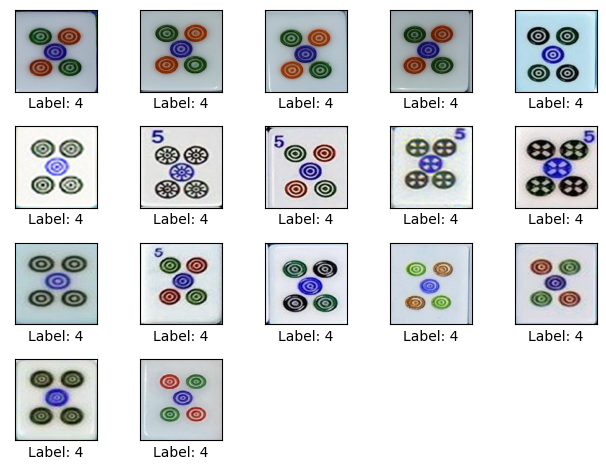

Int64Index([ 26,  47,  60, 111, 167, 196, 238, 280, 332, 358, 400, 420, 487,
            525, 567, 612, 661],
           dtype='int64')


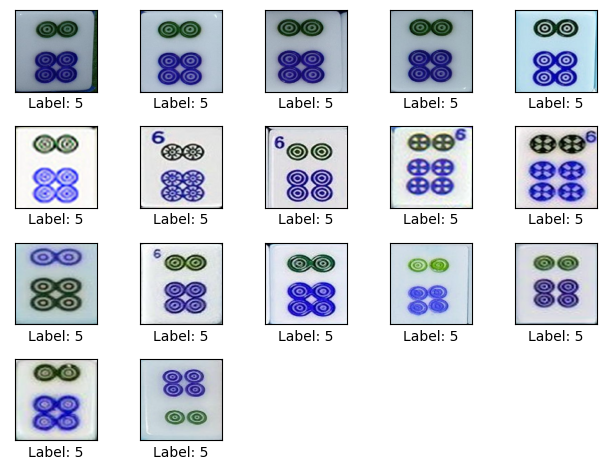

Int64Index([ 25,  45,  89, 101, 166, 192, 250, 277, 331, 355, 397, 421, 484,
            522, 564, 609, 628, 662],
           dtype='int64')


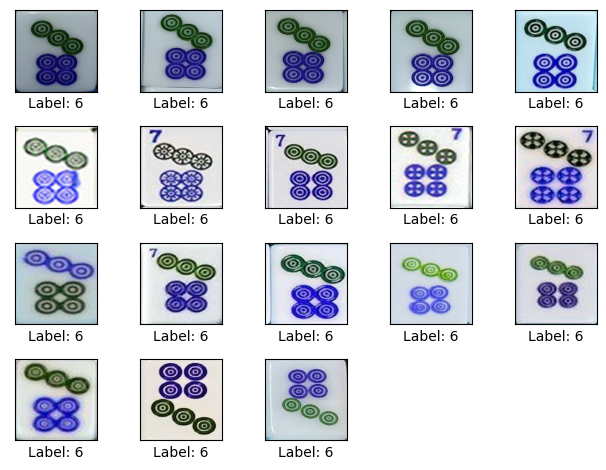

Int64Index([75, 129, 165, 188, 239, 274, 330, 349, 352, 393, 422, 481, 519,
            561, 606, 663],
           dtype='int64')


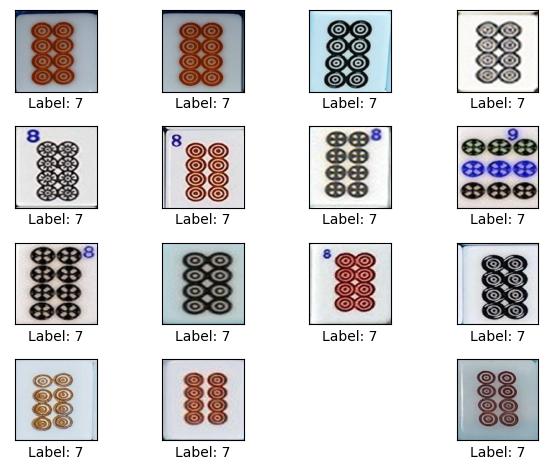

Int64Index([ 31,  51,  64,  73, 163, 199, 259, 294, 304, 372, 414, 452, 501,
            539, 581, 626, 643, 665, 676, 677],
           dtype='int64')


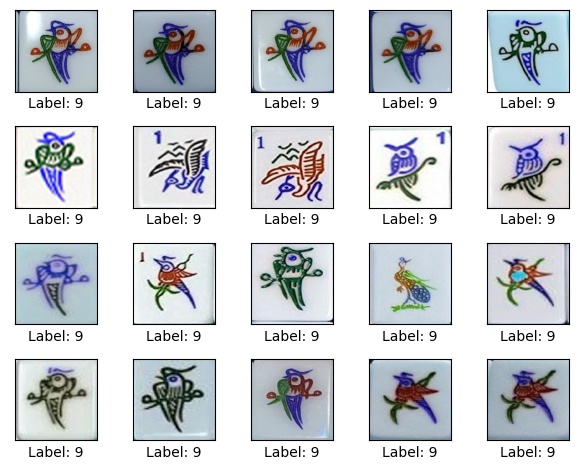

Int64Index([ 29,  54,  77, 133, 161, 191, 243, 288, 298, 366, 408, 458, 495,
            533, 575, 620, 667],
           dtype='int64')


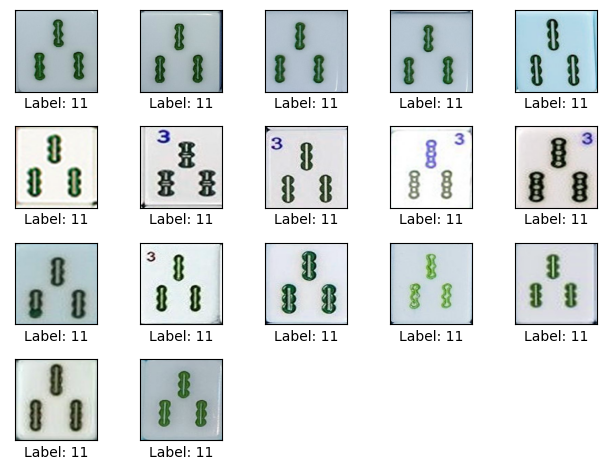

Int64Index([ 69,  70,  87, 117, 160, 187, 241, 285, 297, 363, 405, 459, 492,
            530, 572, 617, 668],
           dtype='int64')


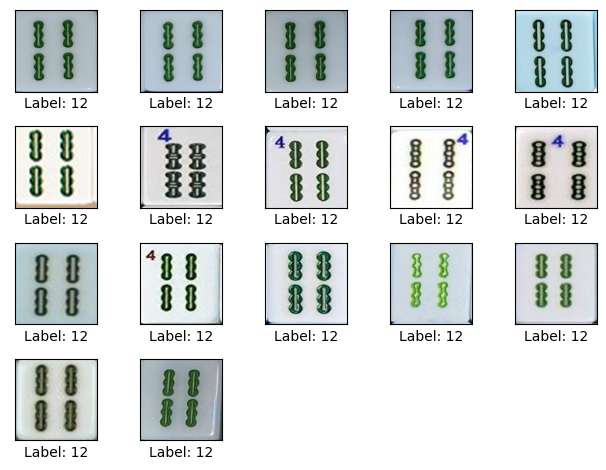

Int64Index([ 95,  97, 105, 134, 159, 186, 233, 282, 302, 360, 402, 460, 489,
            527, 569, 614, 669],
           dtype='int64')


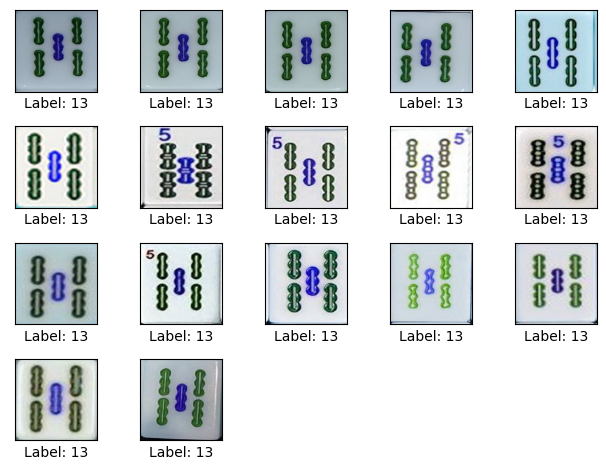

Int64Index([ 59,  72,  79, 100, 158, 198, 230, 279, 301, 357, 399, 447, 486,
            524, 566, 611, 670],
           dtype='int64')


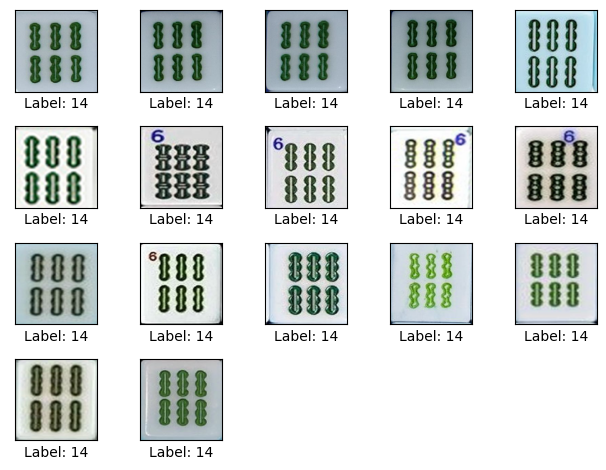

Int64Index([ 83,  85, 107, 120, 155, 185, 255, 270, 296, 348, 390, 450, 477,
            515, 557, 602, 673],
           dtype='int64')


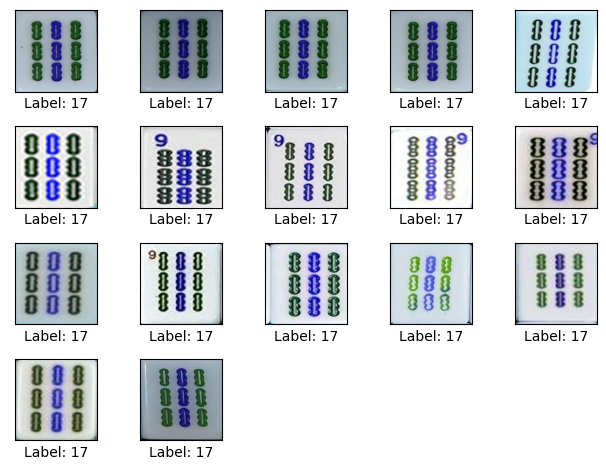

Int64Index([ 10,  65,  88, 106, 180, 217, 234, 290, 327, 368, 410, 453, 497,
            535, 577, 622, 648],
           dtype='int64')


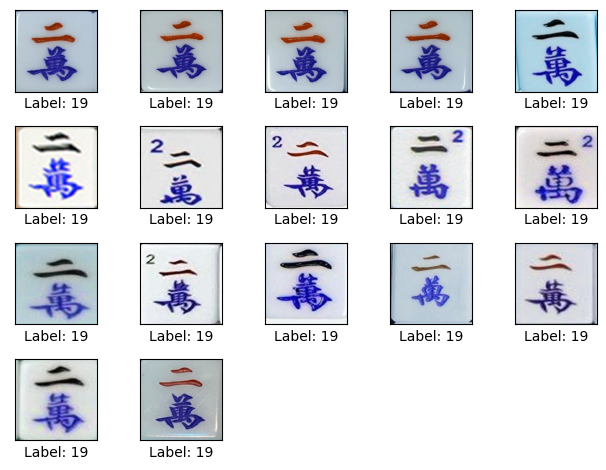

Int64Index([48, 82, 84, 179, 213, 245, 287, 326, 365, 407, 454, 494, 532, 574,
            619, 649],
           dtype='int64')


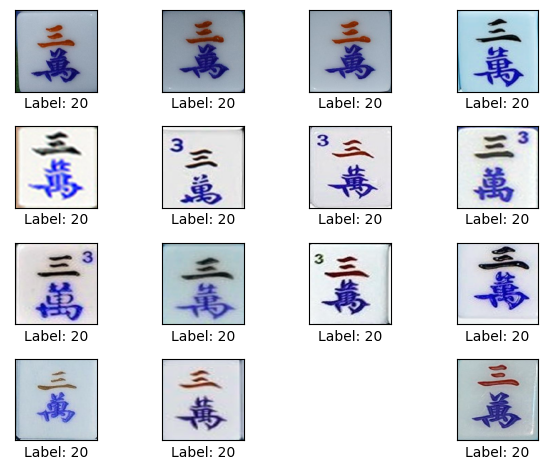

Int64Index([ 13,  21,  42, 118, 177, 222, 235, 281, 324, 359, 401, 456, 488,
            526, 568, 613, 651],
           dtype='int64')


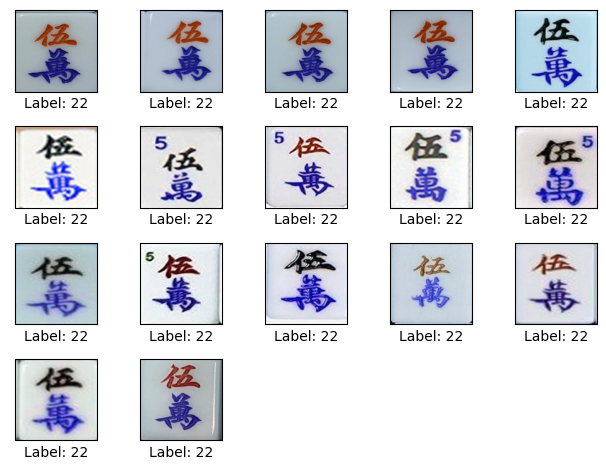

Int64Index([  1,  11,  39, 132, 174, 212, 236, 272, 321, 350, 392, 445, 479,
            517, 559, 604, 654, 678],
           dtype='int64')


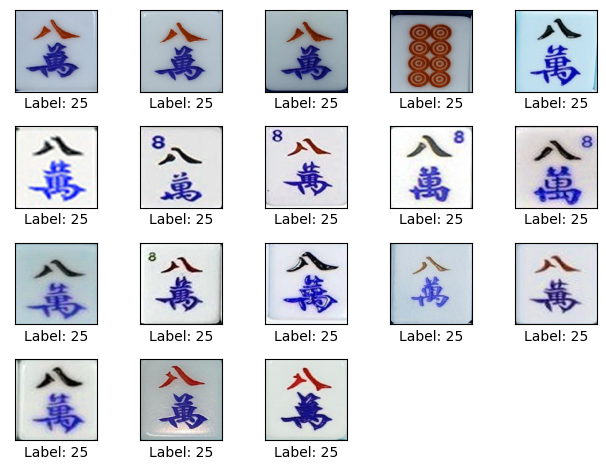

Int64Index([ 19,  23,  81, 110, 145, 215, 232, 266, 318, 345, 384, 433, 471,
            509, 551, 596, 640, 697],
           dtype='int64')


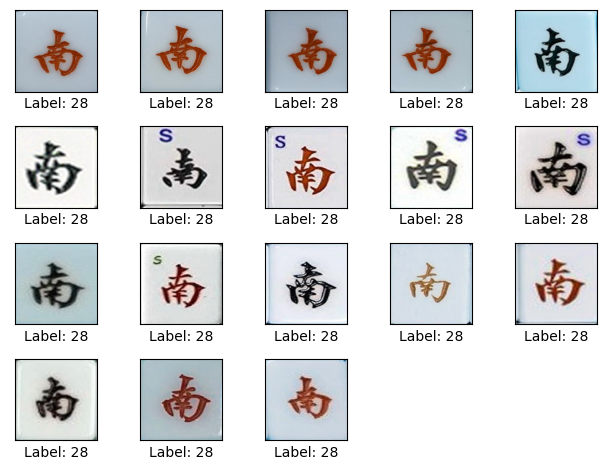

Int64Index([  9,  37,  67,  98, 144, 211, 257, 267, 317, 344, 386, 434, 473,
            511, 550, 598, 641, 698],
           dtype='int64')


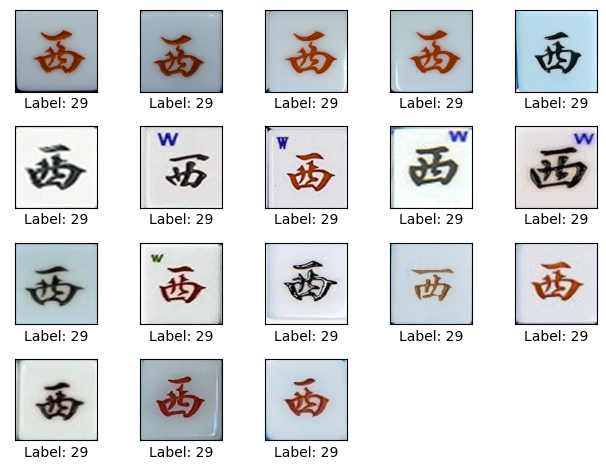

Int64Index([135, 154, 210, 256, 260, 312, 340, 381, 426, 468, 544, 589, 638,
            683],
           dtype='int64')


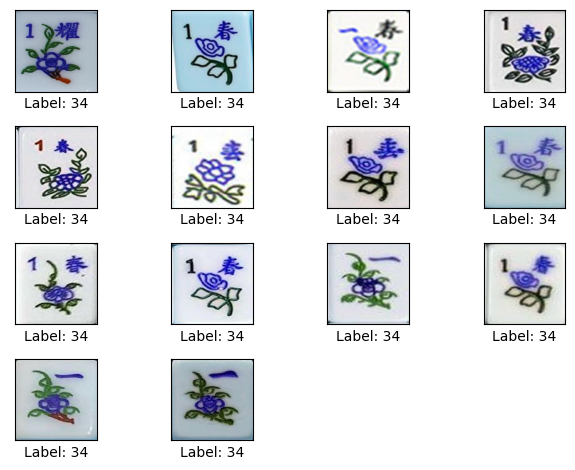

Int64Index([5, 152, 208, 252, 262, 310, 341, 379, 424, 466, 542, 587, 636, 685,
            691],
           dtype='int64')


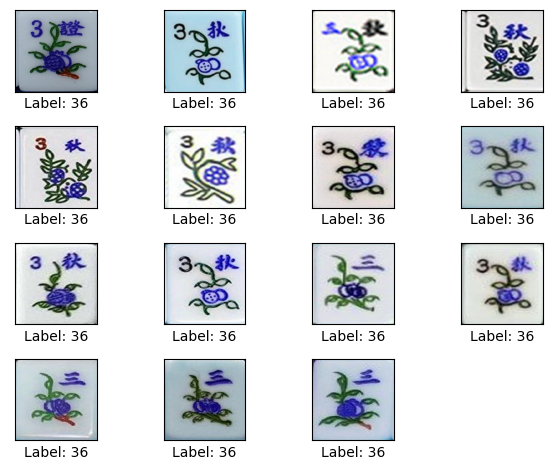

Int64Index([0, 151, 207, 251, 263, 309, 343, 378, 419, 465, 541, 586, 629, 635,
            686, 692],
           dtype='int64')


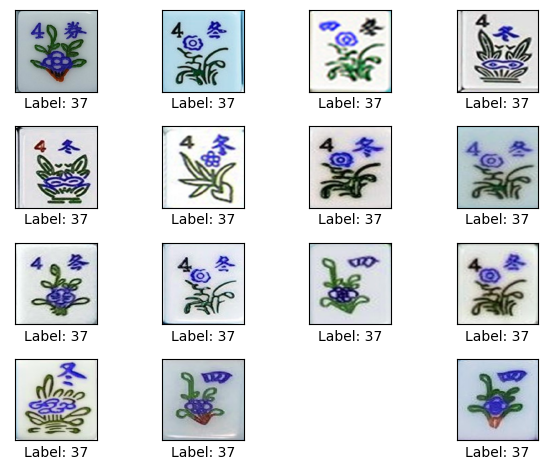

Int64Index([36, 150, 203, 308, 377, 442, 464, 506, 548, 593, 634, 679], dtype='int64')


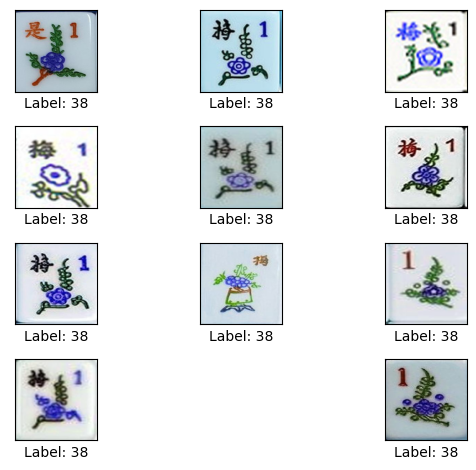

Int64Index([33, 147, 201, 306, 375, 440, 462, 504, 546, 591, 632, 681, 688], dtype='int64')


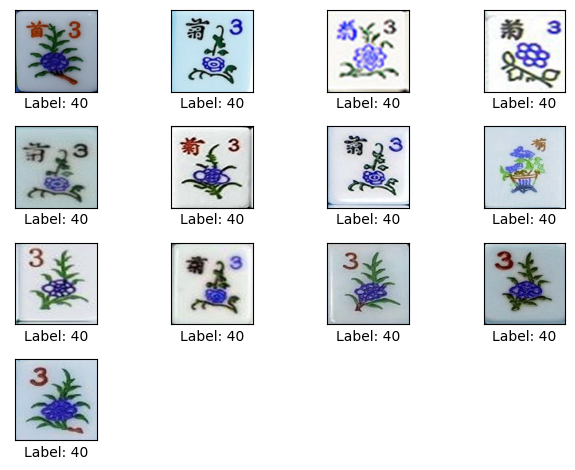

In [67]:
#Display all images of labels we got in f1_list, which is obtained from the function worst_f1_extract
for i in f1_list:
    display_image_label(i)

Several observations here:

1.Some of the images are rotated by 180 degree, including: </br>
a. Label 5: index 661 </br>
b. Label 6: index 628, 662

2.Some have a wrong label: </br>
a. Index 349: Label 8 instead of 7 </br>
b. Index 132: Label 7 instead of 25

So we will try to fix this with: </br>
1.Rotate the images by 180 degrees</br>
2.Fix the labels in mj_df


### Rotate the images by 180 degrees

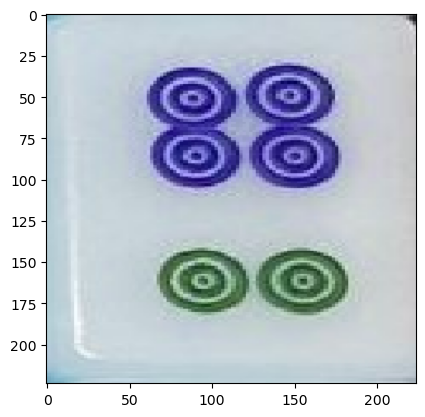

In [68]:
plt.imshow(img_arr[661].astype("uint8"))

In [69]:
img_arr[628] = img_arr[628][::-1,::-1]
img_arr[661] = img_arr[661][::-1,::-1]
img_arr[662] = img_arr[662][::-1,::-1]

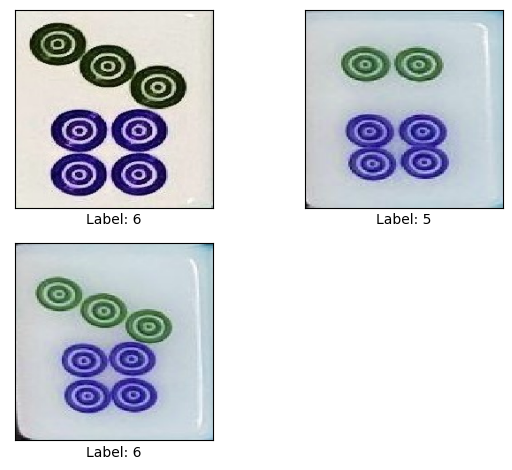

In [70]:
display_image(np.array([img_arr[628],img_arr[661],img_arr[662]]),np.array([label[628],label[661],label[662]]), 3)

### Revise the labels

In [71]:
mj_df.loc[349,['label', 'label_name']] = [8, 'dots-9']
mj_df.loc[132,['label', 'label_name']] = [7, 'dots-8']

In [72]:
mj_df.loc[[132,349]]

,image_name,label,label_name,image_path,width,height,ratio
132,133.jpg,7,dots-8,images\133.jpg,240.0,320.0,0.75
349,350.jpg,8,dots-9,images\350.jpg,240.0,320.0,0.75


### Split the dataset again to reflect the above changes

Train test 1 has a size of (420, 224, 224, 3)
Train test 2 has a size of (420, 224, 224, 3)
Train test 3 has a size of (420, 224, 224, 3)
Train test 4 has a size of (420, 224, 224, 3)


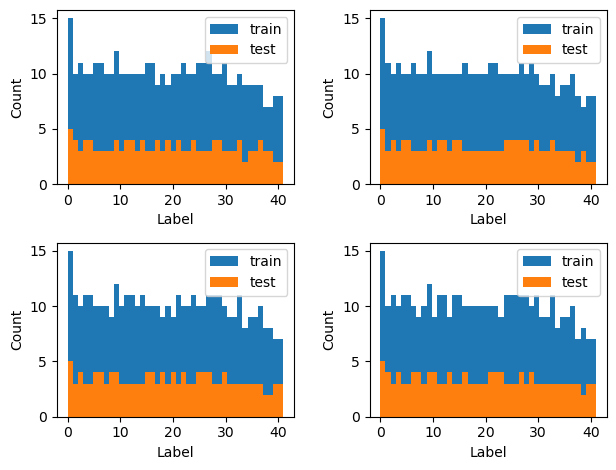

In [73]:
label = np.array(mj_df['label'])
kfold_bar=[]
skf = StratifiedKFold(n_splits=4, shuffle=True, random_state=320)
fig = plt.figure()
n=0
indices_train, indices_test = train_test_split(indices, test_size=0.2, random_state=320, stratify=label)
img_train, X_test = img_arr[indices_train], img_arr[indices_test]
label_train, y_test = label[indices_train], label[indices_test]
for train_index, val_index in skf.split(img_train, label_train):
    X_train, X_val = img_train[train_index].astype('f'), img_train[val_index].astype('f')
    y_train, y_val = tf.keras.utils.to_categorical(label_train[train_index], num_classes=None, dtype='float32'),\
                     tf.keras.utils.to_categorical(label_train[val_index], num_classes=None, dtype='float32')
    n += 1
    print('Train test', n, 'has a size of', X_train.shape)
    fig.tight_layout()
    plt.subplot(2, 2, n)
    plt.hist(label_train[train_index], label="train", bins = num_classes)
    plt.hist(label_train[val_index], label="test", bins = num_classes)
    plt.ylabel('Count')
    plt.xlabel('Label')
    plt.legend(loc=1)

## Training with dropout

To further remedy the overfitting, we will introduce dropout to training. A loop with dropout of 0.1 to 0.5 would be constructed, and see which % of dropout generates the best preditions.

In [74]:
checkpoint_path = "training_4/cp.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)
cp_callback = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,
                                                 save_weights_only=True,
                                                 verbose=1)

In [75]:
inputs = tf.keras.Input(shape=(224, 224, 3))
x = data_augmentation(inputs)
print(x.shape)
x = preprocess_input(x)
print(x.shape)
x = base_model(x, training=False)
print(x.shape)
x = global_average_layer(x)
print(x.shape)

outputs = prediction_layer(x)

print('Output has a dimension of: ' + str(outputs.shape))
model = tf.keras.Model(inputs, outputs)

(None, 224, 224, 3)
(None, 224, 224, 3)
(None, 7, 7, 1280)
(None, 1280)
Output has a dimension of: (None, 42)


In [76]:
batch_size = 16
acc_drop = []
val_acc_drop = []
loss_drop = []
val_loss_drop = []
acc_performance = []
loss_performance = []
y_pred_drop_lst = []

for dropout_rate in [0.1, 0.2, 0.3, 0.4, 0.5]:
    inputs = tf.keras.Input(shape=(224, 224, 3))
    x = data_augmentation(inputs)
    x = preprocess_input(x)
    x = base_model(x, training=False)
    x = global_average_layer(x)
    x = tf.keras.layers.Dropout(dropout_rate)(x)
    outputs = prediction_layer(x)
    model = tf.keras.Model(inputs, outputs)

    model.compile(optimizer=tf.keras.optimizers.Adam(base_learning_rate/100),
              loss=tf.keras.losses.CategoricalCrossentropy(from_logits = False),
              metrics=['accuracy'] )
    model.load_weights("training_3/cp.ckpt")

    total_epochs = 100
    
    cp_callback = tf.keras.callbacks.ModelCheckpoint(f"weights-{dropout_rate}.hdf5", save_best_only=True, save_weights_only=True)
    for train_index, val_index in skf.split(img_train, label_train):
        X_train, X_val = img_train[train_index].astype('f'), img_train[val_index].astype('f')
        y_train, y_val = tf.keras.utils.to_categorical(label_train[train_index], num_classes=None, dtype='float32'),\
                         tf.keras.utils.to_categorical(label_train[val_index], num_classes=None, dtype='float32')
        train_ds = tf.data.Dataset.from_tensor_slices((X_train, y_train)).batch(batch_size)
        val_ds = tf.data.Dataset.from_tensor_slices((X_val, y_val)).batch(batch_size)
        train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE) #place to function too
        val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

        epochs = 5
        print('Before', total_epochs)
        history_drop = model.fit(train_ds,  
                                 validation_data=val_ds,
                                 epochs = total_epochs + epochs,
                                 initial_epoch= total_epochs,
                                 callbacks=[cp_callback]
                                    )
        total_epochs += epochs
        print('After', total_epochs)

        callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
        
        acc_drop += history_drop.history['accuracy']
        val_acc_drop += history_drop.history['val_accuracy']
        acc_tuple = (dropout_rate, acc_drop,val_acc_drop)
        acc_performance.append(acc_tuple)

        loss_drop += history_drop.history['loss']
        val_loss_drop += history_drop.history['val_loss']
        loss_tuple = (dropout_rate, loss_drop,val_loss_drop)
        loss_performance.append(loss_tuple)
    
    y_pred_drop = model.predict(X_test.astype('f'))
    y_pred_drop = np.argmax(y_pred_drop, axis=1)
    perform_tuple = dropout_rate, y_pred_drop
    y_pred_drop_lst.append(perform_tuple)

Before 100
Epoch 101/105
27/27 [==============================] - 38s 779ms/step - loss: 0.0312 - accuracy: 0.9905 - val_loss: 0.1002 - val_accuracy: 0.9929
Epoch 102/105
27/27 [==============================] - 19s 707ms/step - loss: 0.0252 - accuracy: 0.9929 - val_loss: 0.0907 - val_accuracy: 0.9929
Epoch 103/105
27/27 [==============================] - 21s 773ms/step - loss: 0.0373 - accuracy: 0.9857 - val_loss: 0.1035 - val_accuracy: 0.9857
Epoch 104/105
27/27 [==============================] - 20s 757ms/step - loss: 0.0432 - accuracy: 0.9881 - val_loss: 0.0701 - val_accuracy: 0.9929
Epoch 105/105
27/27 [==============================] - 19s 708ms/step - loss: 0.0294 - accuracy: 0.9952 - val_loss: 0.0599 - val_accuracy: 0.9929
After 105
Before 105
Epoch 106/110
27/27 [==============================] - 19s 696ms/step - loss: 0.0267 - accuracy: 0.9929 - val_loss: 0.0106 - val_accuracy: 0.9929
Epoch 107/110
27/27 [==============================] - 19s 690ms/step - loss: 0.0171 - accur

In [77]:
for item in y_pred_drop_lst:
    print('Macro f1 score with dropout of',item[0], f1_score(y_test, item[1], average = 'macro'))

Macro f1 score with dropout of 0.1 0.8849395313681028
Macro f1 score with dropout of 0.2 0.8982237339380196
Macro f1 score with dropout of 0.3 0.8850529100529101
Macro f1 score with dropout of 0.4 0.8550075585789872
Macro f1 score with dropout of 0.5 0.8790816326530612


Model performed the best with dropout of 0.2 and 0.3, with f1 score of 0.90/0.89. At last, we will further test for the best dropout.

### Error analysis of final model

Finally, error analysis on model with dropout of 0.2.

In [88]:
y_pred_drop_lst[1]

(0.2,
 array([ 8,  0, 17, 30, 23,  0, 25, 36,  2, 22, 28, 30, 28,  6, 36, 15, 35,
        16,  4, 14, 24, 19, 39, 33, 39, 20, 41, 33, 37, 26, 13, 39, 21, 29,
        35, 30, 41, 27, 38,  4,  9, 11, 24, 24, 20, 34, 14, 29, 17, 22, 22,
         9, 20, 27,  7, 40, 12, 23, 12,  6, 12, 30,  6, 15, 18,  0, 32, 15,
        23,  3,  8, 33, 33, 37,  6,  4,  1, 10, 27, 23,  3, 31, 26, 29,  1,
        22, 26,  3, 17, 29, 35,  9,  7, 31,  5,  0, 19,  0, 22, 40,  6, 36,
        14, 28,  8, 18, 10, 25, 17, 27, 19, 10,  7, 36, 11,  8, 34, 11, 37,
        20, 13, 32, 13, 16, 32,  2, 35,  1, 18, 31, 12, 35, 16, 18,  2, 25,
         5, 29, 21, 41], dtype=int64))

In [89]:
y_pred_drop2 = y_pred_drop_lst[1][1]

In [90]:
cr_drop = classification_report(y_test , y_pred_drop2, output_dict=True)
rpt_drop = pd.DataFrame.from_dict(cr_drop).T
rpt_drop

,precision,recall,f1-score,support
0,1.000000,1.000000,1.000000,5.000000
1,1.000000,1.000000,1.000000,3.000000
2,1.000000,1.000000,1.000000,3.000000
3,1.000000,1.000000,1.000000,3.000000
4,1.000000,1.000000,1.000000,3.000000
5,1.000000,0.666667,0.800000,3.000000
6,0.800000,1.000000,0.888889,4.000000
7,1.000000,1.000000,1.000000,3.000000
8,1.000000,1.000000,1.000000,4.000000
9,1.000000,0.750000,0.857143,4.000000


In [94]:
#Get label and index of those having f1-score <0.8
f1_thresold = 0.8
lowf1_drop = worst_f1_extract(rpt_drop, f1_thresold)
lowf1_drop

Worst performing labels with f1-scocre < 0.8 are: [22, 34, 35, 36, 37, 38, 40]


,label,index
50,22,177
85,22,568
98,22,222
7,34,683
113,34,638
45,34,381
34,35,690
126,35,543
90,35,467
116,36,262


In [95]:
(f1_img, f1_label, num_img) = f1_array(lowf1_drop)

No. of images in test set  with f1-scocre < 0.8 20


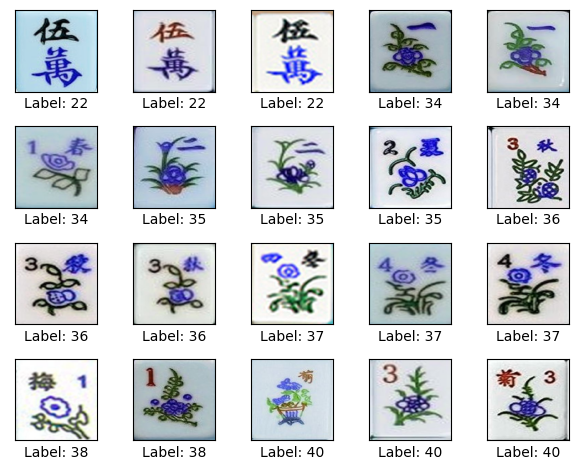

In [96]:
display_image(f1_img, f1_label, num_img)

Only label 22, 34, 35, 36, 37, 38, 40 have a f1-score <0.8. With reference to the images, all the labels look quite different except label 5, leading to inaccurate prediction by the model.

## Conclusion

The tuned Mobilenet_V2 model with trained output layer of GlobalAveragePooling2D demonstrated its ability to classify mahjong class, with accuracy ~0.9 on test set. The image dataset has a relatively small size of 700 images and 42 classes, which could lead to insufficient data for training, even with data augmentation. It is noticed that honours (label 34-41) varies significantly between tiles, which may have led to the inaccurate predictions.

The model accuracy on test set has further improved after dropout was introduced, from ~0.86 to ~0.9. 

To further improved the accuracy of model, a larger data set, especially on honours (label 34-41) shall be required.